In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
import time
import random
import shutil
import warnings
from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, UnidentifiedImageError

In [4]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score, precision_score, recall_score, f1_score
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

print('TensorFlow version:', tf.__version__)
print('GPU available:', tf.config.list_physical_devices('GPU'))

TensorFlow version: 2.20.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# **EDA**

In [5]:
train_dir = '/content/drive/MyDrive/AIML(Assessment)/Part2/Flower Classification/Flower Classification/Train'
test_dir = '/content/drive/MyDrive/AIML(Assessment)/Part2/Flower Classification/Flower Classification/Test'
DATASET_DIR = '/content/drive/MyDrive/AIML(Assessment)/Part2/Flower Classification/Flower Classification'

classes = ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']

In [6]:
#folder to save cleaned images
cleaned_dir = "cleaned_data"

#create cleaned_data folder
os.makedirs(cleaned_dir, exist_ok=True)

#store number of valid images
image_counts = {}

print("Cleaning Training Dataset")
print("=" * 40)

for class_name in classes:
  source_folder = os.path.join(train_dir, class_name)
  target_folder = os.path.join(cleaned_dir, class_name)

  #create class folder inside cleaned_data
  os.makedirs(target_folder, exist_ok=True)

  #check if source folder exists
  if not os.path.isdir(source_folder):
    print(f"{class_name} folder not found")
    image_counts[class_name] = 0
    continue

  valid_count = 0
  corrupted_count = 0

  for file_name in os.listdir(source_folder):
    if not file_name.lower().endswith(".jpg"):
      continue

    file_path = os.path.join(source_folder, file_name)
    try:
      img = Image.open(file_path)
      img.verify()
      #copy valid image
      shutil.copy(file_path, os.path.join(target_folder, file_name))
      valid_count += 1

    except:
      corrupted_count += 1

  image_counts[class_name] = valid_count

  print(f"Class: {class_name}")
  print(f"Valid Images: {valid_count}")
  print(f"Corrupted Images Removed: {corrupted_count}")
  print("-" * 40)

Cleaning Training Dataset
Class: daisy
Valid Images: 756
Corrupted Images Removed: 7
----------------------------------------
Class: dandelion
Valid Images: 1044
Corrupted Images Removed: 7
----------------------------------------
Class: rose
Valid Images: 776
Corrupted Images Removed: 7
----------------------------------------
Class: sunflower
Valid Images: 725
Corrupted Images Removed: 7
----------------------------------------
Class: tulip
Valid Images: 976
Corrupted Images Removed: 7
----------------------------------------


In [7]:
def get_image_counts(folder_path, class_list):
    image_total = {}
    for class_name in class_list:
        current_path = os.path.join(folder_path, class_name)
        if os.path.isdir(current_path):
            image_files = [
                img for img in os.listdir(current_path)
                if img.lower().endswith(".jpg")
            ]
            image_total[class_name] = len(image_files)

        else:
            image_total[class_name] = 0
    return image_total

train_counts = get_image_counts(train_dir, classes)
print("Image Count in Training Dataset")
print("=" * 35)

for class_name, total in train_counts.items():
    print(f"{class_name} : {total} images")

Image Count in Training Dataset
daisy : 763 images
dandelion : 1051 images
rose : 783 images
sunflower : 732 images
tulip : 983 images


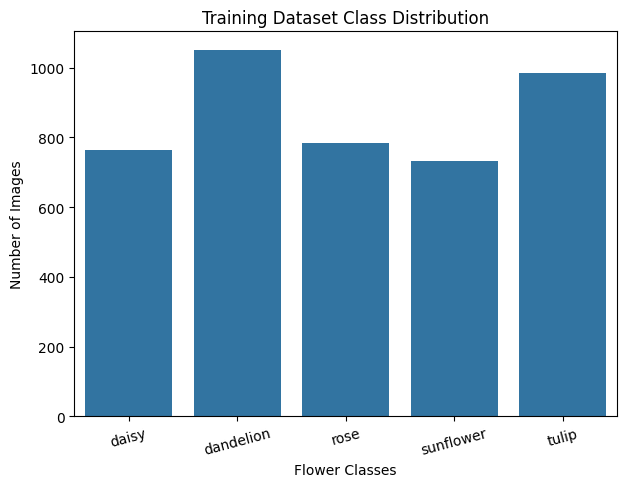

In [25]:
import seaborn as sns
plt.figure(figsize=(7, 5))
sns.barplot(
    x=list(train_counts.keys()),
    y=list(train_counts.values())
)

plt.title("Training Dataset Class Distribution")
plt.xlabel("Flower Classes")
plt.ylabel("Number of Images")
plt.xticks(rotation=15)
plt.show()

Displaying One Sample Image From Each Class


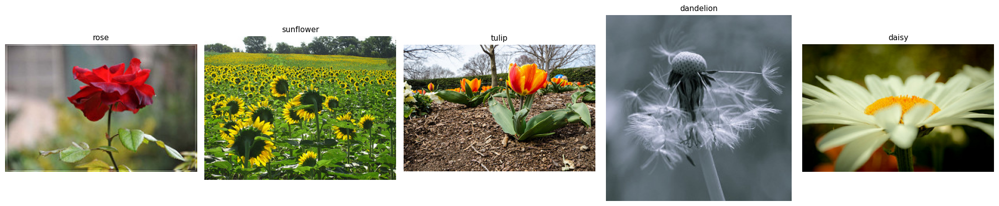

In [11]:
def show_sample_images(folder_path):
    #check if folder exists
    if not os.path.isdir(folder_path):
        print(f"{folder_path} folder not found")
        return

    class_folders = [
        folder for folder in os.listdir(folder_path)
        if os.path.isdir(os.path.join(folder_path, folder))
    ]
    image_list = []
    label_list = []

    for folder_name in class_folders:
        current_folder = os.path.join(folder_path, folder_name)
        valid_images = [
            file for file in os.listdir(current_folder)
            if file.lower().endswith((".jpg", ".jpeg", ".png"))
        ]

        if len(valid_images) == 0:
            print(f"No images found in {current_folder}")
            continue

        selected_image = valid_images[0]
        image_path = os.path.join(current_folder, selected_image)
        try:
            image = plt.imread(image_path)

            image_list.append(image)
            label_list.append(folder_name)

        except Exception as error:
            print(f"Unable to load image: {error}")

    total_images = len(image_list)

    plt.figure(figsize=(4 * total_images, 4))

    for index in range(total_images):
        plt.subplot(1, total_images, index + 1)
        plt.imshow(image_list[index])
        plt.title(label_list[index], fontsize=11)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

print("Displaying One Sample Image From Each Class")
show_sample_images(train_dir)

In [12]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
dataset_path = "cleaned_data"

#image settings
img_height = 150
img_width = 150
batch_size = 64

#data augmentation and normalization
data_generator = ImageDataGenerator(
    rescale=1.0 / 255,
    validation_split=0.2,
    rotation_range=15,
    width_shift_range=0.15,
    height_shift_range=0.15,
    zoom_range=0.15,
    shear_range=0.15,
    horizontal_flip=True
)

#training data generator
train_data = data_generator.flow_from_directory(
    directory=dataset_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode="categorical",
    subset="training"
)

#validation data generator
validation_data = data_generator.flow_from_directory(
    directory=dataset_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode="categorical",
    subset="validation"
)

Found 3423 images belonging to 5 classes.
Found 854 images belonging to 5 classes.


In [13]:
#storing model metrics and training time for final comparison
training_times = {}
model_results = {}

Sample Augmented Images


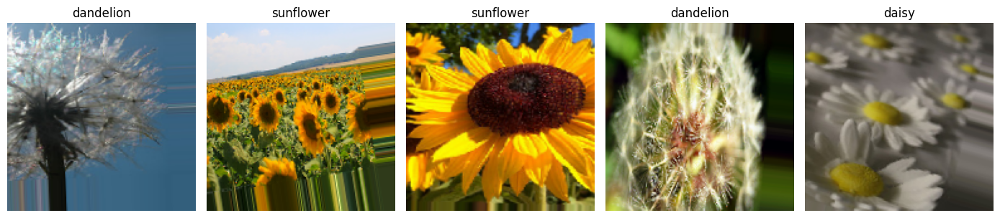

In [14]:
#reset training generator
train_data.reset()
#get one batch of augmented images
batch_images, batch_labels = next(train_data)
#number of images to display
display_count = min(5, len(batch_images))
#convert images back for visualization
display_images = (batch_images * 255).astype("uint8")
#get class names from labels
label_indexes = np.argmax(batch_labels, axis=1)
label_names = [classes[index] for index in label_indexes]

print("Sample Augmented Images")
plt.figure(figsize=(14, 3))
for index in range(display_count):
    plt.subplot(1, display_count, index + 1)
    plt.imshow(display_images[index])
    plt.title(label_names[index])
    plt.axis("off")

plt.tight_layout()
plt.savefig("augmented_image_samples.png")
plt.show()

# **Base Model**

In [15]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Conv2D,
    MaxPooling2D,
    Dense,
    Flatten
)
from tensorflow.keras.optimizers import Adam

#image input shape
input_shape = (150, 150, 3)
#total number of output classes
total_classes = len(classes)
#build baseline CNN model
baseline_model = Sequential([

    #first CNN Block
    Conv2D(
        filters=32,
        kernel_size=(3, 3),
        activation="relu",
        padding="same",
        input_shape=input_shape
    ),
    MaxPooling2D(pool_size=(2, 2)),

    #second CNN Block
    Conv2D(
        filters=64,
        kernel_size=(3, 3),
        activation="relu",
        padding="same"
    ),
    MaxPooling2D(pool_size=(2, 2)),

    #third CNN Block
    Conv2D(
        filters=128,
        kernel_size=(3, 3),
        activation="relu",
        padding="same"
    ),
    MaxPooling2D(pool_size=(2, 2)),

    #flatten layer
    Flatten(),

    #fully connected layers
    Dense(512, activation="relu"),
    Dense(256, activation="relu"),
    Dense(128, activation="relu"),

    #output layer
    Dense(total_classes, activation="softmax")
])

#compile model
baseline_model.compile(
    optimizer=Adam(learning_rate=0.0002),
    loss="categorical_crossentropy",
    metrics=[
        "accuracy",
        "Precision",
        "Recall",
        "AUC"
    ]
)

#show model structure
baseline_model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 41472)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    21,234,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,492,293 (81.99 MB)

 Trainable params: 21,492,293 (81.99 MB)

 Non-trainable params: 0 (0.00 B)

In [16]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import time

#early stopping callback
early_stop = EarlyStopping(
    monitor="val_loss",
    patience=3,
    restore_best_weights=True
)
#learning rate reduction callback
reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=2,
    verbose=1
)
#record training start time
start_time = time.time()

#train baseline CNN model
history_baseline = baseline_model.fit(
    train_data,
    epochs=100,
    validation_data=validation_data,
    callbacks=[early_stop, reduce_lr]
)

#save total training time
training_times["Baseline CNN"] = time.time() - start_time
print(
    "Training Time (Baseline CNN):",
    round(training_times["Baseline CNN"], 2),
    "seconds"
)

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 50s 758ms/step - AUC: 0.7624 - Precision: 0.5662 - Recall: 0.1224 - accuracy: 0.4219 - loss: 1.3289 - val_AUC: 0.8232 - val_Precision: 0.5950 - val_Recall: 0.1944 - val_accuracy: 0.5234 - val_loss: 1.1799 - learning_rate: 2.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 594ms/step - AUC: 0.8395 - Precision: 0.6520 - Recall: 0.3108 - accuracy: 0.5419 - loss: 1.1173 - val_AUC: 0.8474 - val_Precision: 0.6538 - val_Recall: 0.4180 - val_accuracy: 0.5574 - val_loss: 1.0924 - learning_rate: 2.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 584ms/step - AUC: 0.8586 - Precision: 0.6992 - Recall: 0.4148 - accuracy: 0.5881 - loss: 1.0507 - val_AUC: 0.8667 - val_Precision: 0.6958 - val_Recall: 0.4660 - val_accuracy: 0.5890 - val_loss: 1.0207 - learning_rate: 2.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 33s 603ms/step - AUC: 0.8777 - Precision: 0.7211 - Recall: 0.4692 - accuracy: 0.6085 - loss: 0.9819 - val_AUC: 0.8756 - val_Precision: 0.7038 - v

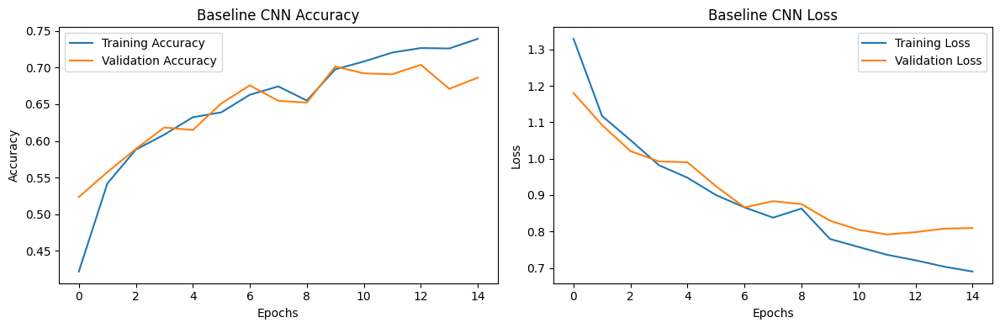

In [17]:
import matplotlib.pyplot as plt

#accuracy graph
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(
    history_baseline.history["accuracy"],
    label="Training Accuracy"
)
plt.plot(
    history_baseline.history["val_accuracy"],
    label="Validation Accuracy"
)
plt.title("Baseline CNN Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

#loss graph
plt.subplot(1, 2, 2)
plt.plot(
    history_baseline.history["loss"],
    label="Training Loss"
)
plt.plot(
    history_baseline.history["val_loss"],
    label="Validation Loss"
)
plt.title("Baseline CNN Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.tight_layout()
plt.show()

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step 
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


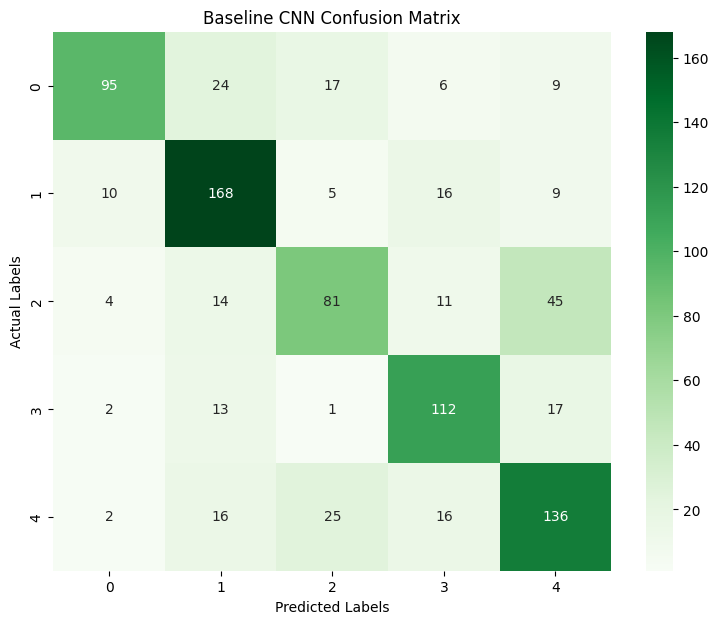

In [19]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

#store actual and predicted labels
actual_labels = []
predicted_labels = []

#generate predictions from validation dataset
for batch_index in range(len(validation_data)):

    batch_x, batch_y = validation_data[batch_index]

    prediction = baseline_model.predict(batch_x)

    actual_labels.extend(np.argmax(batch_y, axis=1))
    predicted_labels.extend(np.argmax(prediction, axis=1))

#creating confusion matrix
cm = confusion_matrix(actual_labels, predicted_labels)

#confusion matrix
plt.figure(figsize=(9, 7))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Greens"
)
plt.xlabel("Predicted Labels")
plt.ylabel("Actual Labels")
plt.title("Baseline CNN Confusion Matrix")
plt.show()

In [20]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

#evaluation metrics
accuracy = accuracy_score(actual_labels, predicted_labels)
precision = precision_score(
    actual_labels,
    predicted_labels,
    average="weighted"
)

recall = recall_score(
    actual_labels,
    predicted_labels,
    average="weighted"
)

f1_score_value = f1_score(
    actual_labels,
    predicted_labels,
    average="weighted"
)

#model performance
print("Accuracy :", accuracy)
print("Precision:", precision)
print("Recall   :", recall)
print("F1 Score :", f1_score_value)

#saving results for comparison
model_results["Baseline CNN"] = {
    "Accuracy": accuracy,
    "Precision": precision,
    "Recall": recall,
    "F1 Score": f1_score_value,
    "Training Time (sec)": training_times.get("Baseline CNN")
}

Accuracy : 0.6932084309133489
Precision: 0.6986155730513006
Recall   : 0.6932084309133489
F1 Score : 0.6909196059365373


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


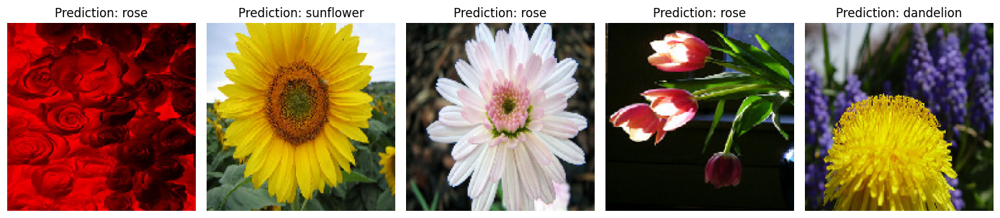

In [21]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import (
    load_img,
    img_to_array
)

#image settings
image_size = (150, 150)
#class labels
class_names = [
    "daisy",
    "dandelion",
    "rose",
    "sunflower",
    "tulip"
]

#function to prepare image for prediction
def prepare_image(image_path):
    image = load_img(image_path, target_size=image_size)
    image_array = img_to_array(image)
    #normalize image
    image_array = image_array / 255.0
    #add batch dimension
    image_array = np.expand_dims(image_array, axis=0)
    return image_array

#collecting image paths from test directory
sample_images = []
for root, folders, files in os.walk(test_dir):
    for file_name in files:
        if file_name.lower().endswith((".jpg", ".jpeg", ".png")):
            relative_path = os.path.relpath(
                os.path.join(root, file_name),
                test_dir
            )
            sample_images.append(relative_path)

#display only first 5 images
sample_images = sample_images[:5]
#create subplot
fig, axes = plt.subplots(
    1,
    len(sample_images),
    figsize=(14, 7)
)

#handle single image case
if len(sample_images) == 1:
    axes = [axes]

#predict and display images
for index, image_file in enumerate(sample_images):

    full_image_path = os.path.join(test_dir, image_file)

    #load image
    image = load_img(
        full_image_path,
        target_size=image_size
    )

    #preprocess image
    processed_image = prepare_image(full_image_path)

    #make prediction
    prediction = baseline_model.predict(processed_image)
    predicted_index = np.argmax(prediction, axis=1)[0]
    predicted_label = class_names[predicted_index]

    #display image
    axes[index].imshow(image)
    axes[index].set_title(
        f"Prediction: {predicted_label}",
        fontsize=12
    )
    axes[index].set_xlabel(
        image_file,
        fontsize=8
    )
    axes[index].axis("off")

plt.tight_layout()
plt.savefig("baseline_cnn_predictions.png")
plt.show()

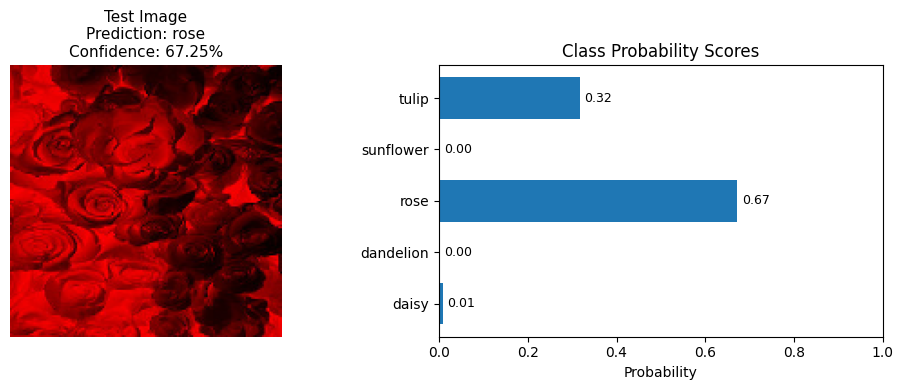

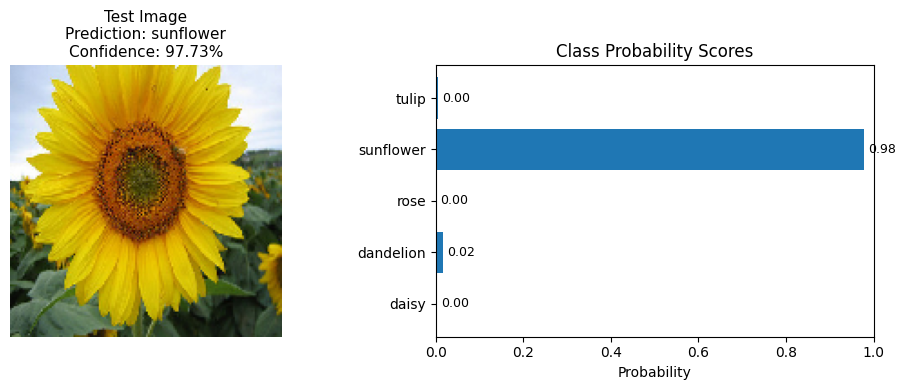

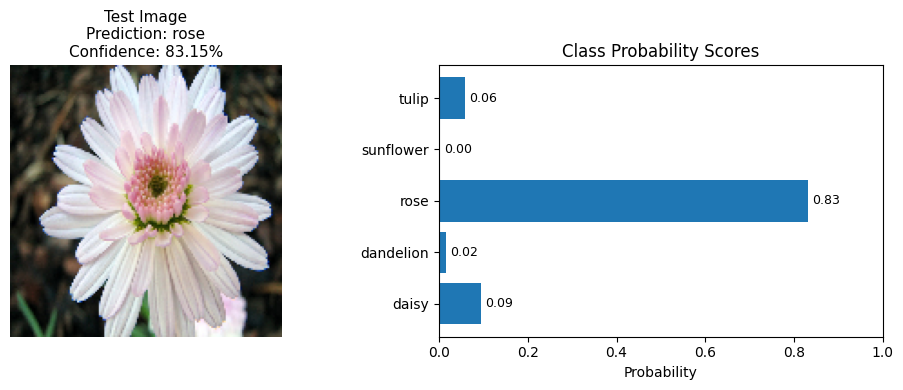

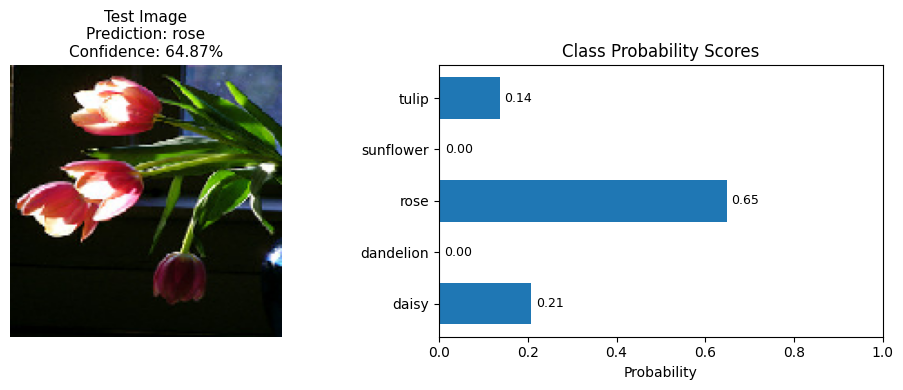

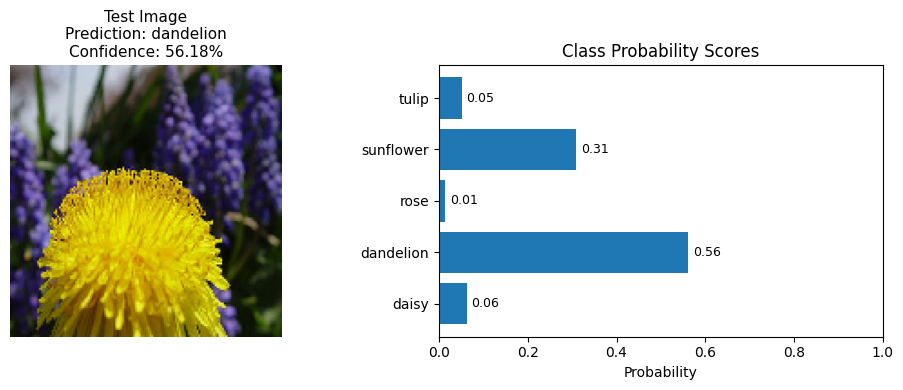

In [22]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import load_img

#display prediction probabilities for sample test images
for index, image_file in enumerate(sample_images):

    full_image_path = os.path.join(test_dir, image_file)

    #prepare image for model prediction
    processed_image = prepare_image(full_image_path)

    #predict class probabilities
    prediction = baseline_model.predict(processed_image, verbose=0)

    predicted_index = np.argmax(prediction[0])
    predicted_label = class_names[predicted_index]
    confidence = prediction[0][predicted_index]

    #load original image for display
    image = load_img(
        full_image_path,
        target_size=image_size
    )

    #create image + probability chart
    fig, axes = plt.subplots(
        1,
        2,
        figsize=(10, 4)
    )

    #show test image
    axes[0].imshow(image)
    axes[0].axis("off")
    axes[0].set_title(
        f"Test Image\nPrediction: {predicted_label}\nConfidence: {confidence:.2%}",
        fontsize=11
    )

    #show prediction probabilities
    y_positions = np.arange(len(class_names))

    axes[1].barh(
        y_positions,
        prediction[0]
    )
    axes[1].set_yticks(y_positions)
    axes[1].set_yticklabels(class_names)

    axes[1].set_xlim(0, 1)
    axes[1].set_xlabel("Probability")
    axes[1].set_title("Class Probability Scores")

    #add probability values beside bars
    for i, value in enumerate(prediction[0]):
        axes[1].text(
            value + 0.01,
            i,
            f"{value:.2f}",
            va="center",
            fontsize=9
        )
    plt.tight_layout()
    plt.show()

# **Deeper Model**

In [27]:
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.layers import (
    BatchNormalization,
    Activation,
    Dropout
)

# build deeper CNN model
deeper_model = Sequential([

    # first CNN Block
    Conv2D(
        16,
        (3, 3),
        padding="same",
        input_shape=input_shape
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.2),

    # second CNN Block
    Conv2D(
        32,
        (3, 3),
        padding="same"
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.25),

    #third CNN Block
    Conv2D(
        64,
        (3, 3),
        padding="same"
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),

    #fourth CNN Block
    Conv2D(
        128,
        (3, 3),
        padding="same"
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.35),

    #fifth CNN Block
    Conv2D(
        128,
        (3, 3),
        padding="same"
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.4),

    #sixth CNN Block
    Conv2D(
        256,
        (3, 3),
        padding="same"
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.45),

    #flatten layer
    Flatten(),

    #dense layers
    Dense(512, activation="relu"),
    Dropout(0.5),
    Dense(256, activation="relu"),
    Dropout(0.4),
    Dense(128, activation="relu"),
    Dropout(0.3),
    Dense(64, activation="relu"),
    Dropout(0.2),

    #output layer
    Dense(total_classes, activation="softmax")
])

#model summary
deeper_model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 150, 150, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 150, 150, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 150, 150, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 75, 75, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 75, 75, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 75, 75, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 37, 37, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 37, 37, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 18, 18, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 18, 18, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 9, 9, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 1,240,293 (4.73 MB)

 Trainable params: 1,239,045 (4.73 MB)

 Non-trainable params: 1,248 (4.88 KB)

# **SGD Model**

In [28]:
deeper_model.compile(
    optimizer=SGD(
        learning_rate=2e-4,
        momentum=0.9
    ),
    loss="categorical_crossentropy",
    metrics=[
        "accuracy",
        "Precision",
        "Recall",
        "AUC"
    ]
)

In [29]:
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau
)
import time

#stop training if validation loss does not improve
stop_training = EarlyStopping(
    monitor="val_loss",
    patience=3,
    restore_best_weights=True
)

#reduce learning rate during plateau
lr_scheduler = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=2,
    verbose=1
)

#start timing model training
sgd_start_time = time.time()

#train deeper CNN using SGD optimizer
history_sgd = deeper_model.fit(

    train_data,

    epochs=100,

    validation_data=validation_data,

    callbacks=[
        stop_training,
        lr_scheduler
    ]
)

#save training duration
training_times["Deeper CNN - SGD"] = (
    time.time() - sgd_start_time
)
print(
    "Deeper CNN (SGD) Training Time:",
    round(training_times["Deeper CNN - SGD"], 2),
    "seconds"
)

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 84s 1s/step - AUC: 0.4966 - Precision: 0.2004 - Recall: 0.1180 - accuracy: 0.1975 - loss: 2.5989 - val_AUC: 0.5172 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.1815 - val_loss: 1.6077 - learning_rate: 2.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 30s 560ms/step - AUC: 0.5104 - Precision: 0.1931 - Recall: 0.0608 - accuracy: 0.2089 - loss: 1.9649 - val_AUC: 0.5269 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.2026 - val_loss: 1.6069 - learning_rate: 2.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 30s 560ms/step - AUC: 0.5137 - Precision: 0.2172 - Recall: 0.0459 - accuracy: 0.2054 - loss: 1.8548 - val_AUC: 0.5406 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.2283 - val_loss: 1.6057 - learning_rate: 2.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 30s 557ms/step - AUC: 0.5121 - Precision: 0.2007 - Recall: 0.0316 - accuracy: 0.2150 - loss: 1.8108 - val_AUC: 0.5348 - val_

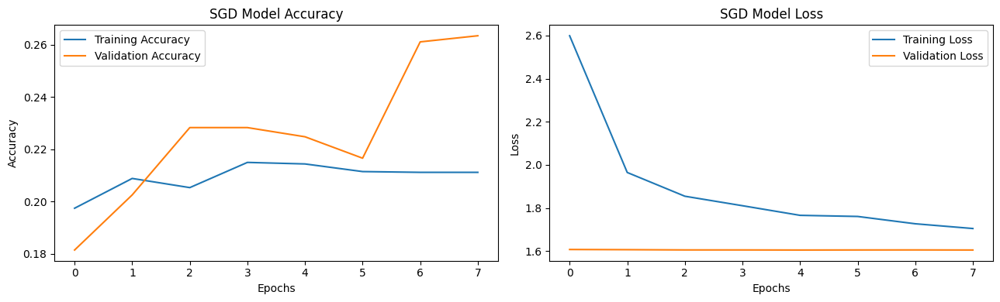

In [31]:
import matplotlib.pyplot as plt

#creating training performance plots
fig, axes = plt.subplots(
    1,
    2,
    figsize=(13, 4)
)

# Accuracy graph
axes[0].plot(
    history_sgd.history["accuracy"],
    label="Training Accuracy"
)
axes[0].plot(
    history_sgd.history["val_accuracy"],
    label="Validation Accuracy"
)
axes[0].set_title("SGD Model Accuracy")
axes[0].set_xlabel("Epochs")
axes[0].set_ylabel("Accuracy")
axes[0].legend()

# Loss graph
axes[1].plot(
    history_sgd.history["loss"],
    label="Training Loss"
)
axes[1].plot(
    history_sgd.history["val_loss"],
    label="Validation Loss"
)
axes[1].set_title("SGD Model Loss")
axes[1].set_xlabel("Epochs")
axes[1].set_ylabel("Loss")
axes[1].legend()
plt.tight_layout()
plt.show()

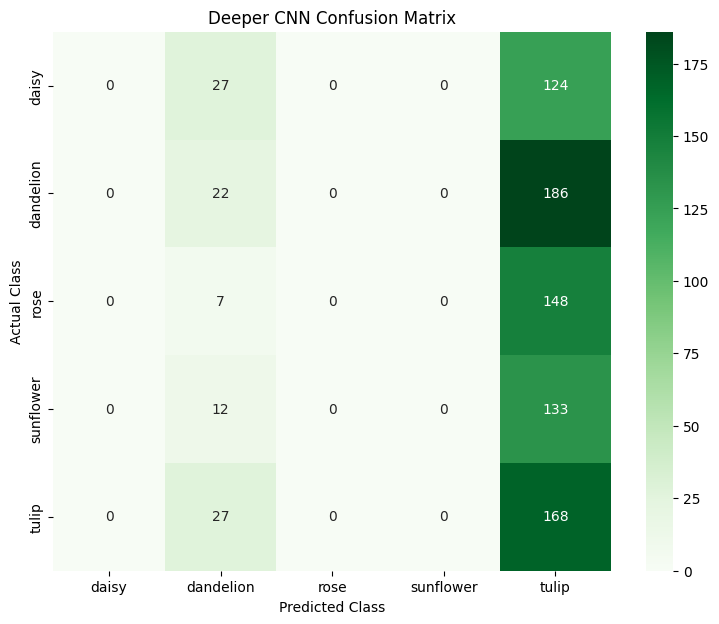

In [32]:
actual_classes = []
predicted_classes = []

#generate predictions using validation dataset
for batch_number in range(len(validation_data)):
    batch_images, batch_labels = validation_data[batch_number]
    predicted_output = deeper_model.predict(
        batch_images,
        verbose=0
    )
    actual_classes.extend(
        np.argmax(batch_labels, axis=1)
    )
    predicted_classes.extend(
        np.argmax(predicted_output, axis=1)
    )

#create confusion matrix
conf_matrix = confusion_matrix(
    actual_classes,
    predicted_classes
)

# Plot confusion matrix
plt.figure(figsize=(9, 7))
sns.heatmap(
    conf_matrix,
    annot=True,
    fmt="d",
    cmap="Greens",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Class")
plt.ylabel("Actual Class")
plt.title("Deeper CNN Confusion Matrix")
plt.show()

In [33]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

#calculate model evaluation metrics
sgd_accuracy = accuracy_score(
    actual_classes,
    predicted_classes
)

sgd_precision = precision_score(
    actual_classes,
    predicted_classes,
    average="weighted"
)

sgd_recall = recall_score(
    actual_classes,
    predicted_classes,
    average="weighted"
)

sgd_f1 = f1_score(
    actual_classes,
    predicted_classes,
    average="weighted"
)

#display results
print("SGD Model Accuracy :", sgd_accuracy)
print("SGD Model Precision:", sgd_precision)
print("SGD Model Recall   :", sgd_recall)
print("SGD Model F1 Score :", sgd_f1)

#save results for comparison
model_results["Deeper CNN - SGD"] = {
    "Accuracy": sgd_accuracy,
    "Precision": sgd_precision,
    "Recall": sgd_recall,
    "F1 Score": sgd_f1,
    "Training Time (sec)": training_times.get(
        "Deeper CNN - SGD"
    )
}

SGD Model Accuracy : 0.2224824355971897
SGD Model Precision: 0.10694435174309129
SGD Model Recall   : 0.2224824355971897
SGD Model F1 Score : 0.11578906995909258


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


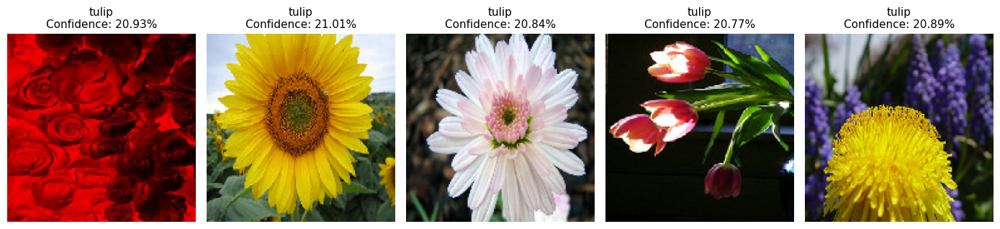

In [36]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import (
    load_img,
    img_to_array
)

#image configuration
image_size = (150, 150)

#flower categories
flower_labels = [
    "daisy",
    "dandelion",
    "rose",
    "sunflower",
    "tulip"
]

#function to prepare image
def process_test_image(image_path):

    image = load_img(
        image_path,
        target_size=image_size
    )
    image_array = img_to_array(image)

    #normalize pixel values
    image_array = image_array / 255.0

    #convert into batch format
    image_array = np.expand_dims(
        image_array,
        axis=0
    )

    return image_array

#store sample image paths
test_images = []

for root, folders, files in os.walk(test_dir):
    for file_name in files:
        if file_name.lower().endswith(
            (".jpg", ".jpeg", ".png")
        ):
            relative_path = os.path.relpath(
                os.path.join(root, file_name),
                test_dir
            )
            test_images.append(relative_path)

#select first few images
test_images = test_images[:5]

#create subplot layout
fig, axes = plt.subplots(
    1,
    len(test_images),
    figsize=(14, 7)
)

#handle single image case
if len(test_images) == 1:
    axes = [axes]

#predict and display images
for image_index, image_file in enumerate(test_images):

    image_path = os.path.join(
        test_dir,
        image_file
    )

    #load original image
    original_image = load_img(
        image_path,
        target_size=image_size
    )

    #prepare image for prediction
    prepared_image = process_test_image(
        image_path
    )

    #generate prediction
    prediction = deeper_model.predict(
        prepared_image,
        verbose=0
    )
    predicted_index = np.argmax(
        prediction,
        axis=1
    )[0]
    predicted_label = flower_labels[
        predicted_index
    ]
    confidence_score = prediction[0][
        predicted_index
    ]

    #display image
    axes[image_index].imshow(
        original_image
    )
    axes[image_index].set_title(
        f"{predicted_label}\nConfidence: {confidence_score:.2%}",
        fontsize=11
    )
    axes[image_index].set_xlabel(
        image_file,
        fontsize=8
    )
    axes[image_index].axis("off")

plt.tight_layout()
plt.savefig(
    "deeper_cnn_predictions.png"
)
plt.show()

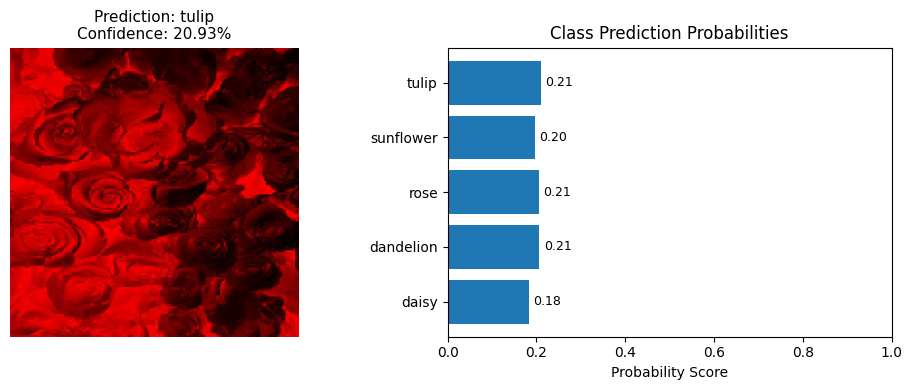

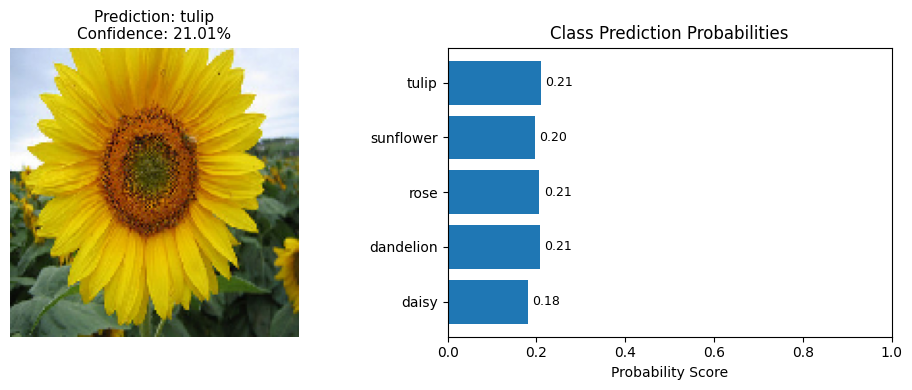

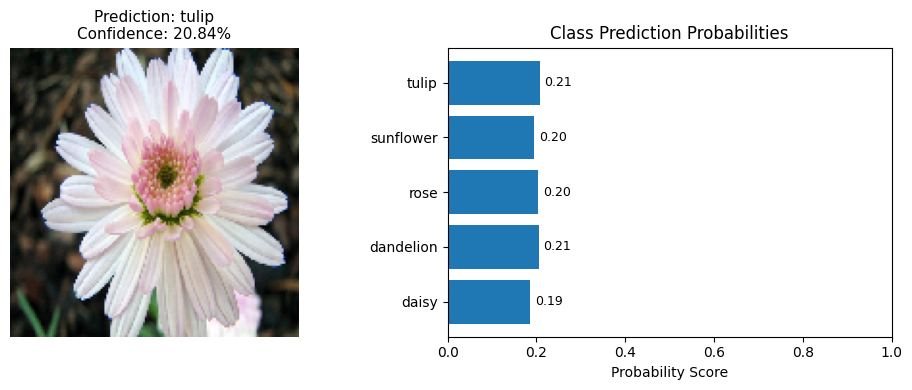

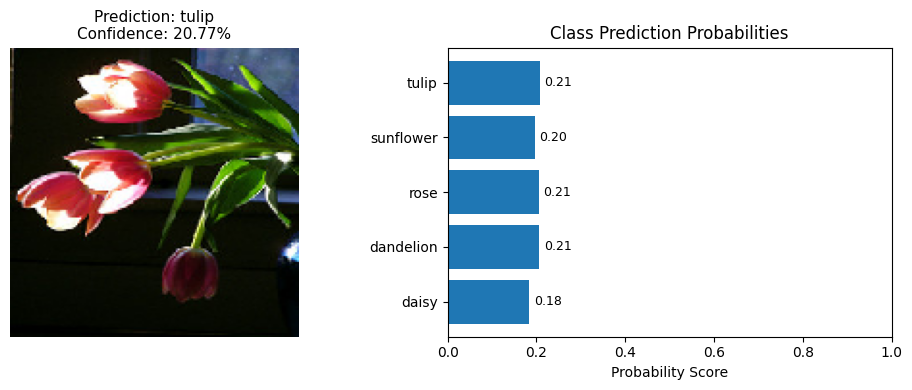

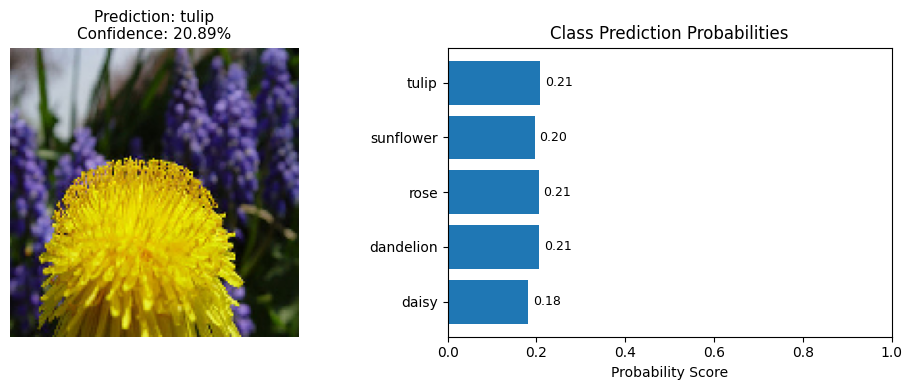

In [37]:
import matplotlib.pyplot as plt
import numpy as np

#display prediction probability charts
for image_number, image_file in enumerate(test_images):
    image_path = os.path.join(
        test_dir,
        image_file
    )
    #prepare image for prediction
    processed_image = process_test_image(
        image_path
    )

    #predict probabilities
    prediction_scores = deeper_model.predict(
        processed_image,
        verbose=0
    )

    predicted_index = np.argmax(
        prediction_scores[0]
    )

    predicted_flower = flower_labels[
        predicted_index
    ]

    confidence = prediction_scores[0][
        predicted_index
    ]

    # create subplot
    fig, (left_plot, right_plot) = plt.subplots(
        1,
        2,
        figsize=(10, 4)
    )

    #load and display image
    original_image = load_img(
        image_path,
        target_size=image_size
    )

    left_plot.imshow(original_image)

    left_plot.axis("off")

    left_plot.set_title(
        f"Prediction: {predicted_flower}\nConfidence: {confidence:.2%}",
        fontsize=11
    )

    #horizontal probability chart
    y_positions = np.arange(
        len(flower_labels)
    )
    right_plot.barh(
        y_positions,
        prediction_scores[0]
    )

    right_plot.set_yticks(
        y_positions
    )

    right_plot.set_yticklabels(
        flower_labels
    )
    right_plot.set_xlim(0, 1)

    right_plot.set_xlabel(
        "Probability Score"
    )
    right_plot.set_title(
        "Class Prediction Probabilities"
    )
    #display probability values
    for i, value in enumerate(
        prediction_scores[0]
    ):

        right_plot.text(
            value + 0.01,
            i,
            f"{value:.2f}",
            va="center",
            fontsize=9
        )
    plt.tight_layout()
    plt.show()

## Adam Model

In [39]:
# Rebuild deeper CNN model for Adam optimizer training
# Reinitializing the model keeps the optimizer comparison unbiased.

adam_model = Sequential([
    #feature Extraction Block 1
    Conv2D(
        filters=16,
        kernel_size=(3, 3),
        padding="same",
        input_shape=input_shape
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D((2, 2)),
    Dropout(0.2),

    #feature Extraction Block 2
    Conv2D(
        filters=32,
        kernel_size=(3, 3),
        padding="same"
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D((2, 2)),
    Dropout(0.3),

    #feature Extraction Block 3
    Conv2D(
        filters=64,
        kernel_size=(3, 3),
        padding="same"
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D((2, 2)),
    Dropout(0.3),

    #feature Extraction Block 4
    Conv2D(
        filters=128,
        kernel_size=(3, 3),
        padding="same"
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D((2, 2)),
    Dropout(0.4),

    #feature Extraction Block 5
    Conv2D(
        filters=128,
        kernel_size=(3, 3),
        padding="same"
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D((2, 2)),
    Dropout(0.4),

    #feature Extraction Block 6
    Conv2D(
        filters=256,
        kernel_size=(3, 3),
        padding="same"
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D((2, 2)),
    Dropout(0.5),

    #flatten output
    Flatten(),

    #fully connected layers
    Dense(512, activation="relu"),
    Dropout(0.5),

    Dense(256, activation="relu"),
    Dropout(0.5),

    Dense(128, activation="relu"),
    Dropout(0.4),

    Dense(64, activation="relu"),
    Dropout(0.3),

    #final classification layer
    Dense(total_classes, activation="softmax")
])

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [44]:
#Adam-based CNN model
adam_model.compile(
    optimizer=Adam(
        learning_rate=2e-4
    ),
    loss="categorical_crossentropy",
    metrics=[
        "accuracy",
        "Precision",
        "Recall",
        "AUC"
    ]
)

In [45]:
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau
)
import time

# Callback to stop training when validation loss stops improving
adam_early_stop = EarlyStopping(
    monitor="val_loss",
    patience=3,
    restore_best_weights=True
)
# Reduce learning rate if validation loss plateaus
adam_lr_scheduler = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=2,
    verbose=1
)
# Record training start time
adam_start_time = time.time()
# Train model using Adam optimizer
history_adam = adam_model.fit(

    train_data,

    epochs=100,

    validation_data=validation_data,

    callbacks=[
        adam_early_stop,
        adam_lr_scheduler
    ]
)
# Store total training duration
training_times["Deeper CNN - Adam"] = (
    time.time() - adam_start_time
)
print(
    "Deeper CNN (Adam) Training Time:",
    round(training_times["Deeper CNN - Adam"], 2),
    "seconds"
)

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 63s 840ms/step - AUC: 0.5128 - Precision: 0.2128 - Recall: 0.0949 - accuracy: 0.2121 - loss: 2.2884 - val_AUC: 0.5324 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.2436 - val_loss: 1.6060 - learning_rate: 2.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 586ms/step - AUC: 0.5298 - Precision: 0.2421 - Recall: 0.0356 - accuracy: 0.2293 - loss: 1.7690 - val_AUC: 0.5316 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.2436 - val_loss: 1.6036 - learning_rate: 2.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 30s 558ms/step - AUC: 0.5351 - Precision: 0.2207 - Recall: 0.0187 - accuracy: 0.2331 - loss: 1.7057 - val_AUC: 0.5372 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.2436 - val_loss: 1.6038 - learning_rate: 2.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step - AUC: 0.5425 - Precision: 0.2673 - Recall: 0.0172 - accuracy: 0.2460 - loss: 1.6656
Epoch 4: ReduceLROnPla

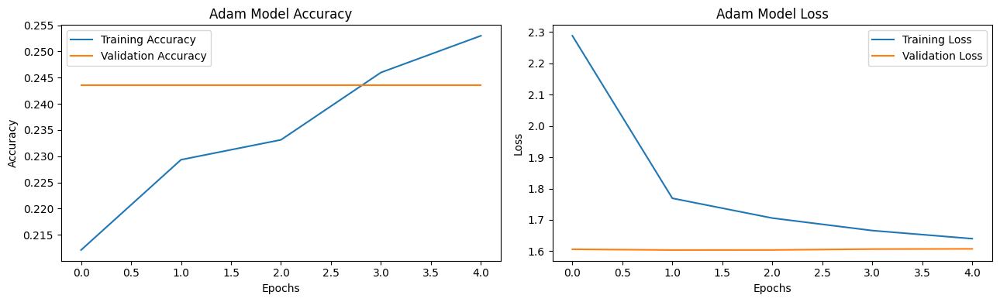

In [47]:
import matplotlib.pyplot as plt

#creating training history plots
fig, plot_axes = plt.subplots(
    1,
    2,
    figsize=(13, 4)
)

# Accuracy graph
plot_axes[0].plot(
    history_adam.history["accuracy"],
    label="Training Accuracy"
)
plot_axes[0].plot(
    history_adam.history["val_accuracy"],
    label="Validation Accuracy"
)
plot_axes[0].set_title(
    "Adam Model Accuracy"
)
plot_axes[0].set_xlabel("Epochs")
plot_axes[0].set_ylabel("Accuracy")
plot_axes[0].legend()

# Loss graph
plot_axes[1].plot(
    history_adam.history["loss"],
    label="Training Loss"
)
plot_axes[1].plot(
    history_adam.history["val_loss"],
    label="Validation Loss"
)
plot_axes[1].set_title(
    "Adam Model Loss"
)

plot_axes[1].set_xlabel("Epochs")
plot_axes[1].set_ylabel("Loss")
plot_axes[1].legend()
plt.tight_layout()
plt.show()

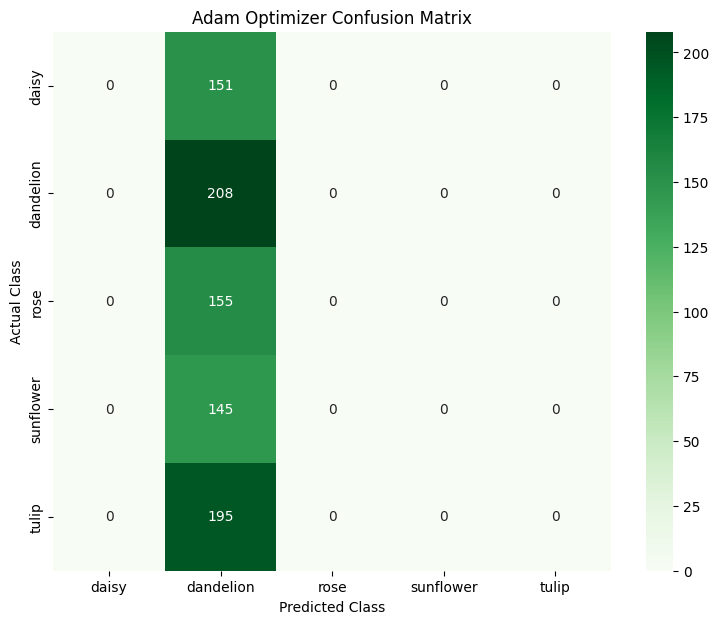

In [49]:
actual_labels_adam = []
predicted_labels_adam = []

#predictions from validation dataset
for batch_id in range(len(validation_data)):
    batch_images, batch_targets = validation_data[batch_id]
    prediction_output = adam_model.predict(
        batch_images,
        verbose=0
    )
    actual_labels_adam.extend(
        np.argmax(batch_targets, axis=1)
    )
    predicted_labels_adam.extend(
        np.argmax(prediction_output, axis=1)
    )

#creating confusion matrix
adam_conf_matrix = confusion_matrix(
    actual_labels_adam,
    predicted_labels_adam
)
#confusion matrix plot
plt.figure(figsize=(9, 7))
sns.heatmap(
    adam_conf_matrix,
    annot=True,
    fmt="d",
    cmap="Greens",
    xticklabels=flower_labels,
    yticklabels=flower_labels
)
plt.xlabel("Predicted Class")
plt.ylabel("Actual Class")
plt.title("Adam Optimizer Confusion Matrix")
plt.show()

In [50]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

#evaluation metrics for Adam model
adam_accuracy = accuracy_score(
    actual_labels_adam,
    predicted_labels_adam
)
adam_precision = precision_score(
    actual_labels_adam,
    predicted_labels_adam,
    average="weighted"
)
adam_recall = recall_score(
    actual_labels_adam,
    predicted_labels_adam,
    average="weighted"
)
adam_f1_score = f1_score(
    actual_labels_adam,
    predicted_labels_adam,
    average="weighted"
)

#performance metrics
print("Adam Model Accuracy :", adam_accuracy)
print("Adam Model Precision:", adam_precision)
print("Adam Model Recall   :", adam_recall)
print("Adam Model F1 Score :", adam_f1_score)

#saving metrics for final comparison
model_results["Deeper CNN - Adam"] = {
    "Accuracy": adam_accuracy,
    "Precision": adam_precision,
    "Recall": adam_recall,
    "F1 Score": adam_f1_score,
    "Training Time (sec)": training_times.get(
        "Deeper CNN - Adam"
    )
}

Adam Model Accuracy : 0.24355971896955503
Adam Model Precision: 0.059321336704528625
Adam Model Recall   : 0.24355971896955503
Adam Model F1 Score : 0.09540569029315903


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


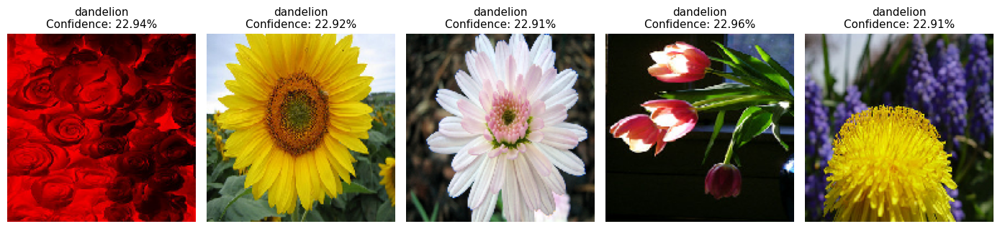

In [56]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import (
    load_img,
    img_to_array
)
image_size = (150, 150)
adam_classes = [
    "daisy",
    "dandelion",
    "rose",
    "sunflower",
    "tulip"
]

# Prepare image for Adam model prediction
def prepare_adam_image(image_path):
    image = load_img(
        image_path,
        target_size=image_size
    )
    image_array = img_to_array(image)
    image_array = image_array / 255.0
    image_array = np.expand_dims(
        image_array,
        axis=0
    )

    return image_array

# Collect sample test images
adam_test_images = []
for root, folders, files in os.walk(test_dir):
    for file_name in files:
        if file_name.lower().endswith(
            (".jpg", ".jpeg", ".png")
        ):
            relative_file = os.path.relpath(
                os.path.join(root, file_name),
                test_dir
            )

            adam_test_images.append(relative_file)

# Use first five images only
adam_test_images = adam_test_images[:5]

# Create figure
fig, axes = plt.subplots(
    1,
    len(adam_test_images),
    figsize=(14, 7)
)

# Prevent error when only one image exists
if len(adam_test_images) == 1:
    axes = [axes]

# Predict and display images
for image_id, image_file in enumerate(adam_test_images):
    image_path = os.path.join(
        test_dir,
        image_file
    )
    original_image = load_img(
        image_path,
        target_size=image_size
    )
    model_input = prepare_adam_image(
        image_path
    )
    prediction = adam_model.predict(
        model_input,
        verbose=0
    )
    predicted_id = np.argmax(
        prediction,
        axis=1
    )[0]
    predicted_name = adam_classes[
        predicted_id
    ]
    confidence = prediction[0][predicted_id]
    axes[image_id].imshow(original_image)
    axes[image_id].set_title(
        f"{predicted_name}\nConfidence: {confidence:.2%}",
        fontsize=11
    )
    axes[image_id].set_xlabel(
        image_file,
        fontsize=8
    )
    axes[image_id].axis("off")
plt.tight_layout()
plt.savefig("adam_model_predictions.png")
plt.show()

# **Deeper CNN Without Dropout**

In [52]:
# CNN ablation model without dropout layers
# Used to analyze the effect of dropout regularization.
no_dropout_model = Sequential([
    # Feature Block 1
    Conv2D(
        16,
        (3, 3),
        padding="same",
        input_shape=input_shape
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D((2, 2)),

    # Feature Block 2
    Conv2D(
        32,
        (3, 3),
        padding="same"
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D((2, 2)),

    # Feature Block 3
    Conv2D(
        64,
        (3, 3),
        padding="same"
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D((2, 2)),

    # Feature Block 4
    Conv2D(
        128,
        (3, 3),
        padding="same"
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D((2, 2)),

    # Feature Block 5
    Conv2D(
        128,
        (3, 3),
        padding="same"
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D((2, 2)),

    # Feature Block 6
    Conv2D(
        256,
        (3, 3),
        padding="same"
    ),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D((2, 2)),

    # Flatten output
    Flatten(),

    # Dense layers
    Dense(512, activation="relu"),
    Dense(256, activation="relu"),
    Dense(128, activation="relu"),
    Dense(64, activation="relu"),

    # Output layer
    Dense(total_classes, activation="softmax")
])
# compiling ablation model
no_dropout_model.compile(

    optimizer=Adam(
        learning_rate=2e-4
    ),

    loss="categorical_crossentropy",

    metrics=[
        "accuracy",
        "Precision",
        "Recall",
        "AUC"
    ]
)

# Start training timer
ablation_start_time = time.time()

# Train ablation model
history_ablation = no_dropout_model.fit(
    train_data,
    epochs=100,
    validation_data=validation_data,
    callbacks=[
        adam_early_stop,
        adam_lr_scheduler
    ]
)
# saving training duration
training_times["Ablation - No Dropout"] = (
    time.time() - ablation_start_time
)
print(
    "Ablation Model Training Time:",
    round(
        training_times["Ablation - No Dropout"],
        2
    ),
    "seconds"
)

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 744ms/step - AUC: 0.8130 - Precision: 0.6637 - Recall: 0.2802 - accuracy: 0.5066 - loss: 1.1945 - val_AUC: 0.5290 - val_Precision: 0.2436 - val_Recall: 0.2436 - val_accuracy: 0.2436 - val_loss: 1.7851 - learning_rate: 2.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step - AUC: 0.8785 - Precision: 0.7078 - Recall: 0.4809 - accuracy: 0.6099 - loss: 0.9763
Epoch 2: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-05.
54/54 ━━━━━━━━━━━━━━━━━━━━ 30s 562ms/step - AUC: 0.8909 - Precision: 0.7222 - Recall: 0.5127 - accuracy: 0.6304 - loss: 0.9272 - val_AUC: 0.5593 - val_Precision: 0.2436 - val_Recall: 0.2436 - val_accuracy: 0.2436 - val_loss: 2.3294 - learning_rate: 2.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 30s 563ms/step - AUC: 0.9149 - Precision: 0.7632 - Recall: 0.5884 - accuracy: 0.6746 - loss: 0.8208 - val_AUC: 0.5731 - val_Precision: 0.2436 - val_Recall: 0.2436 - val_accuracy: 0.2436 - val_loss: 2.7300 - learning

In [53]:
ablation_true_labels = []
ablation_predicted_labels = []

#generate predictions using validation dataset
for batch_index in range(len(validation_data)):
    batch_images, batch_targets = validation_data[batch_index]
    prediction_scores = no_dropout_model.predict(
        batch_images,
        verbose=0
    )
    ablation_true_labels.extend(
        np.argmax(batch_targets, axis=1)
    )
    ablation_predicted_labels.extend(
        np.argmax(prediction_scores, axis=1)
    )
#calculating evaluation metrics
ablation_accuracy = accuracy_score(
    ablation_true_labels,
    ablation_predicted_labels
)

ablation_precision = precision_score(
    ablation_true_labels,
    ablation_predicted_labels,
    average="weighted"
)
ablation_recall = recall_score(
    ablation_true_labels,
    ablation_predicted_labels,
    average="weighted"
)
ablation_f1 = f1_score(
    ablation_true_labels,
    ablation_predicted_labels,
    average="weighted"
)

print("Ablation Model Accuracy :", ablation_accuracy)
print("Ablation Model Precision:", ablation_precision)
print("Ablation Model Recall   :", ablation_recall)
print("Ablation Model F1 Score :", ablation_f1)

#saving metrics for comparison
model_results["Ablation - No Dropout"] = {
    "Accuracy": ablation_accuracy,
    "Precision": ablation_precision,
    "Recall": ablation_recall,
    "F1 Score": ablation_f1,
    "Training Time (sec)": training_times.get(
        "Ablation - No Dropout"
    )
}

Ablation Model Accuracy : 0.24355971896955503
Ablation Model Precision: 0.059321336704528625
Ablation Model Recall   : 0.24355971896955503
Ablation Model F1 Score : 0.09540569029315903


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


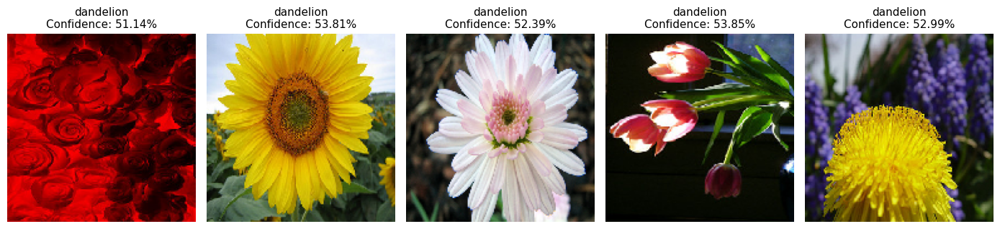

In [54]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import (
    load_img,
    img_to_array
)

image_size = (150, 150)
ablation_classes = [
    "daisy",
    "dandelion",
    "rose",
    "sunflower",
    "tulip"
]

# Prepare image for model prediction
def prepare_ablation_image(image_path):

    image = load_img(
        image_path,
        target_size=image_size
    )

    image_array = img_to_array(image)
    image_array = image_array / 255.0

    image_array = np.expand_dims(
        image_array,
        axis=0
    )

    return image_array


# Collect sample test images
ablation_test_images = []

for root, folders, files in os.walk(test_dir):

    for file_name in files:

        if file_name.lower().endswith(
            (".jpg", ".jpeg", ".png")
        ):

            relative_file = os.path.relpath(
                os.path.join(root, file_name),
                test_dir
            )

            ablation_test_images.append(relative_file)

# Use first five images only
ablation_test_images = ablation_test_images[:5]

# Create figure
fig, axes = plt.subplots(
    1,
    len(ablation_test_images),
    figsize=(14, 7)
)

# Prevent error when only one image exists
if len(ablation_test_images) == 1:
    axes = [axes]

# Predict and display images
for image_id, image_file in enumerate(ablation_test_images):
    image_path = os.path.join(
        test_dir,
        image_file
    )
    original_image = load_img(
        image_path,
        target_size=image_size
    )
    model_input = prepare_ablation_image(
        image_path
    )

    prediction = no_dropout_model.predict(
        model_input,
        verbose=0
    )
    predicted_id = np.argmax(
        prediction,
        axis=1
    )[0]
    predicted_name = ablation_classes[
        predicted_id
    ]

    confidence = prediction[0][predicted_id]
    axes[image_id].imshow(original_image)
    axes[image_id].set_title(
        f"{predicted_name}\nConfidence: {confidence:.2%}",
        fontsize=11
    )
    axes[image_id].set_xlabel(
        image_file,
        fontsize=8
    )
    axes[image_id].axis("off")

plt.tight_layout()
plt.savefig("ablation_model_predictions.png")
plt.show()

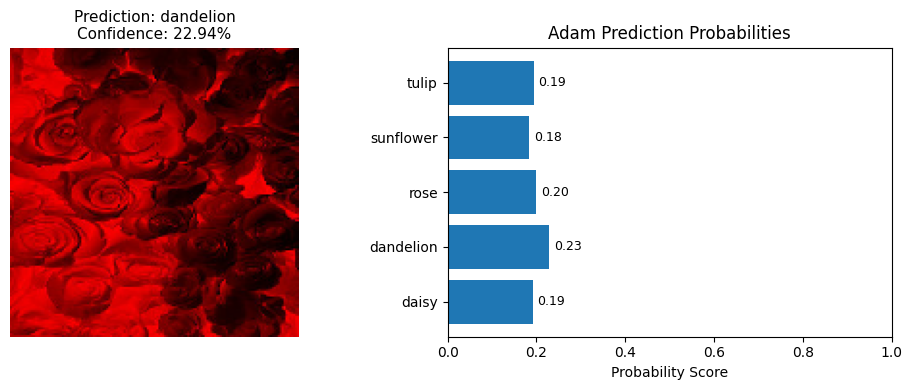

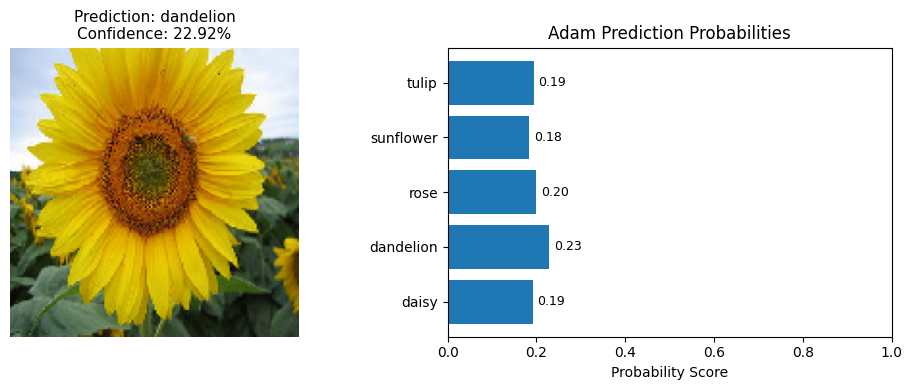

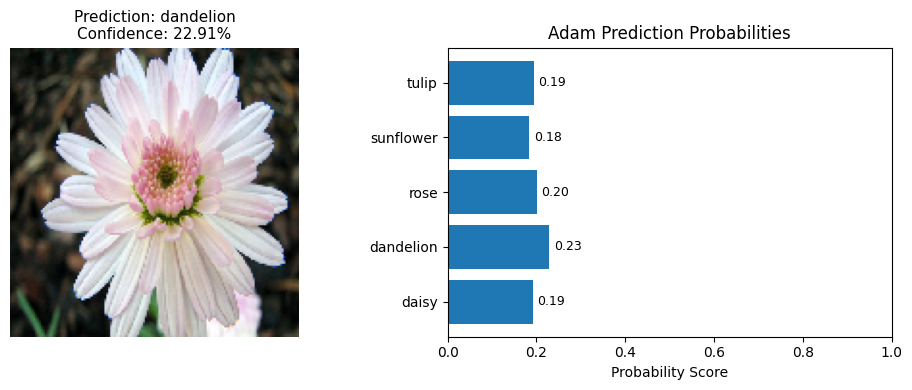

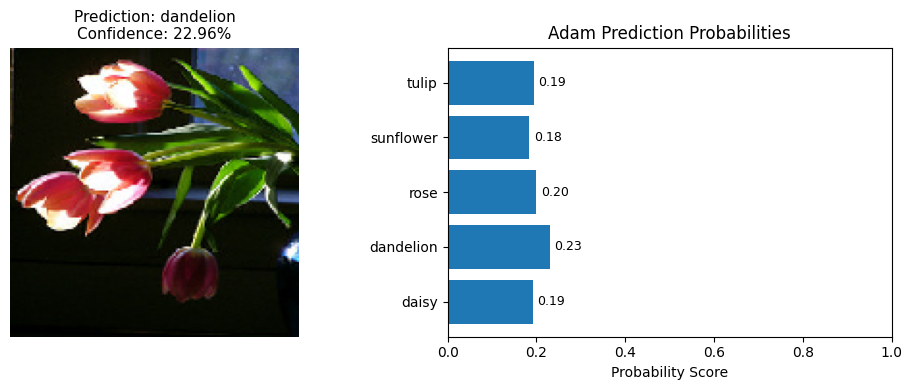

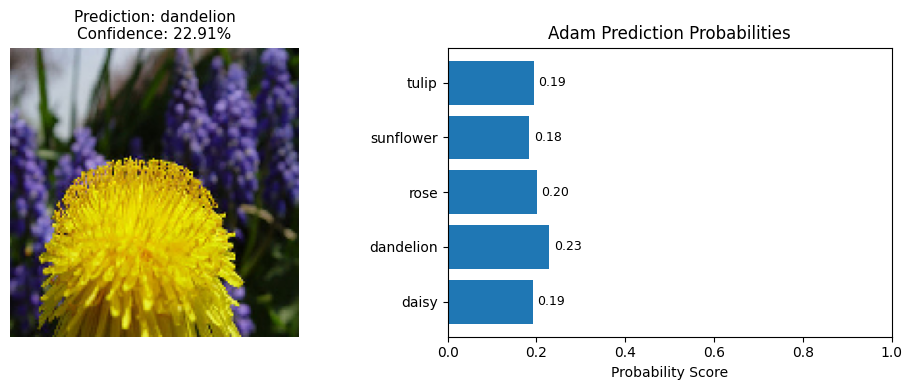

In [55]:
import matplotlib.pyplot as plt
import numpy as np

# Visualize prediction probabilities for Adam model
for image_index, image_file in enumerate(test_images):
    image_path = os.path.join(
        test_dir,
        image_file
    )
    # Prepare image
    prepared_image = process_test_image(
        image_path
    )

    # Generate prediction probabilities
    prediction_scores = adam_model.predict(
        prepared_image,
        verbose=0
    )
    predicted_index = np.argmax(
        prediction_scores[0]
    )
    predicted_flower = flower_labels[
        predicted_index
    ]
    prediction_confidence = prediction_scores[0][
        predicted_index
    ]
    # Create subplot
    fig, (image_plot, probability_plot) = plt.subplots(
        1,
        2,
        figsize=(10, 4)
    )
    # Display image
    original_image = load_img(
        image_path,
        target_size=image_size
    )
    image_plot.imshow(original_image)
    image_plot.axis("off")
    image_plot.set_title(
        f"Prediction: {predicted_flower}\nConfidence: {prediction_confidence:.2%}",
        fontsize=11
    )

    # Horizontal probability chart
    y_positions = np.arange(
        len(flower_labels)
    )
    probability_plot.barh(
        y_positions,
        prediction_scores[0]
    )
    probability_plot.set_yticks(
        y_positions
    )
    probability_plot.set_yticklabels(
        flower_labels
    )
    probability_plot.set_xlim(0, 1)
    probability_plot.set_xlabel(
        "Probability Score"
    )
    probability_plot.set_title(
        "Adam Prediction Probabilities"
    )
    # Add probability values
    for i, score in enumerate(
        prediction_scores[0]
    ):

        probability_plot.text(
            score + 0.01,
            i,
            f"{score:.2f}",
            va="center",
            fontsize=9
        )
    plt.tight_layout()
    plt.show()

# MobileNetV2

In [58]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Dense,
    Dropout
)

# Load pretrained MobileNetV2 model
mobilenet_base = MobileNetV2(
    input_shape=(150, 150, 3),
    include_top=False,
    weights="imagenet",
    pooling="avg"
)

# Freeze pretrained layers
for layer in mobilenet_base.layers:
    layer.trainable = False

# Custom classification head
feature_layer = mobilenet_base.output

feature_layer = Dense(
    512,
    activation="relu"
)(feature_layer)

feature_layer = Dropout(0.5)(
    feature_layer
)

feature_layer = Dense(
    256,
    activation="relu"
)(feature_layer)

feature_layer = Dropout(0.4)(
    feature_layer
)
final_output = Dense(
    len(flower_labels),
    activation="softmax"
)(feature_layer)

# Build transfer learning model
mobilenet_model = Model(
    inputs=mobilenet_base.input,
    outputs=final_output
)

# Compile MobileNetV2 model
mobilenet_model.compile(
    optimizer=Adam(
        learning_rate=2e-4
    ),

    loss="categorical_crossentropy",
    metrics=[
        "accuracy",
        "Precision",
        "Recall",
        "AUC"
    ]
)
mobilenet_model.summary()

/tmp/ipykernel_2061/2907669833.py:9: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet_base = MobileNetV2(


Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 75, 75,    │        864 │ input_layer_6[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 75, 75,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 75, 75,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 75, 75,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 75, 75,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 75, 75,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 75, 75,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 75, 75,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 77, 77,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 38, 38,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 38, 38,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 38, 38,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 38, 38,    │      2,304 │ block_1_depthwis

 Total params: 3,046,469 (11.62 MB)

 Trainable params: 788,485 (3.01 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [59]:
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau
)

import time

# Early stopping callback
mobilenet_early_stop = EarlyStopping(
    monitor="val_loss",
    patience=3,
    restore_best_weights=True
)

# Learning rate scheduler
mobilenet_lr_scheduler = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=2,
    verbose=1
)

# Record training start time
mobilenet_start_time = time.time()

# Train MobileNetV2 model
history_mobilenet = mobilenet_model.fit(
    train_data,
    epochs=100,
    validation_data=validation_data,
    callbacks=[
        mobilenet_early_stop,
        mobilenet_lr_scheduler
    ]
)
# Save training duration
training_times["MobileNetV2"] = (
    time.time() - mobilenet_start_time
)

print(
    "MobileNetV2 Training Time:",
    round(
        training_times["MobileNetV2"],
        2
    ),
    "seconds"
)

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 87s 1s/step - AUC: 0.7682 - Precision: 0.5757 - Recall: 0.3310 - accuracy: 0.4788 - loss: 1.3693 - val_AUC: 0.9376 - val_Precision: 0.8601 - val_Recall: 0.5831 - val_accuracy: 0.7307 - val_loss: 0.7451 - learning_rate: 2.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 585ms/step - AUC: 0.9023 - Precision: 0.7540 - Recall: 0.5659 - accuracy: 0.6696 - loss: 0.8791 - val_AUC: 0.9598 - val_Precision: 0.8772 - val_Recall: 0.6944 - val_accuracy: 0.7892 - val_loss: 0.5927 - learning_rate: 2.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 30s 560ms/step - AUC: 0.9294 - Precision: 0.7858 - Recall: 0.6410 - accuracy: 0.7149 - loss: 0.7478 - val_AUC: 0.9680 - val_Precision: 0.8920 - val_Recall: 0.7447 - val_accuracy: 0.8150 - val_loss: 0.5221 - learning_rate: 2.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 43s 795ms/step - AUC: 0.9441 - Precision: 0.8098 - Recall: 0.6941 - accuracy: 0.7531 - loss: 0.6634 - val_AUC: 0.9672 - val_Precision: 0.8815 - val_

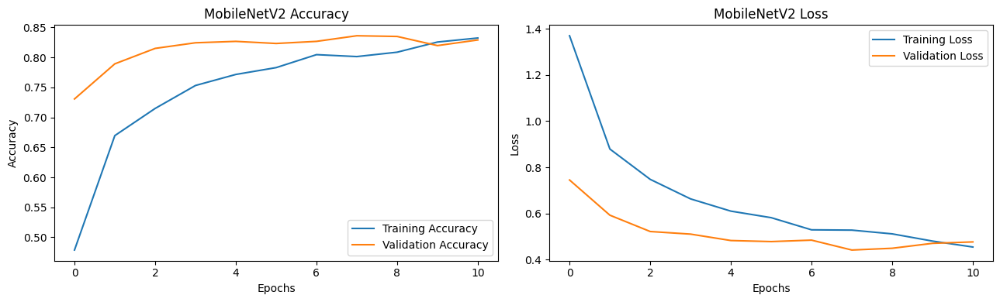

In [60]:
import matplotlib.pyplot as plt

# Create MobileNetV2 training plots
fig, axes = plt.subplots(
    1,
    2,
    figsize=(13, 4)
)

# Accuracy graph
axes[0].plot(
    history_mobilenet.history["accuracy"],
    label="Training Accuracy"
)
axes[0].plot(
    history_mobilenet.history["val_accuracy"],
    label="Validation Accuracy"
)
axes[0].set_title(
    "MobileNetV2 Accuracy"
)
axes[0].set_xlabel("Epochs")
axes[0].set_ylabel("Accuracy")
axes[0].legend()

# Loss graph
axes[1].plot(
    history_mobilenet.history["loss"],
    label="Training Loss"
)
axes[1].plot(
    history_mobilenet.history["val_loss"],
    label="Validation Loss"
)
axes[1].set_title(
    "MobileNetV2 Loss"
)
axes[1].set_xlabel("Epochs")
axes[1].set_ylabel("Loss")
axes[1].legend()
plt.tight_layout()
plt.show()

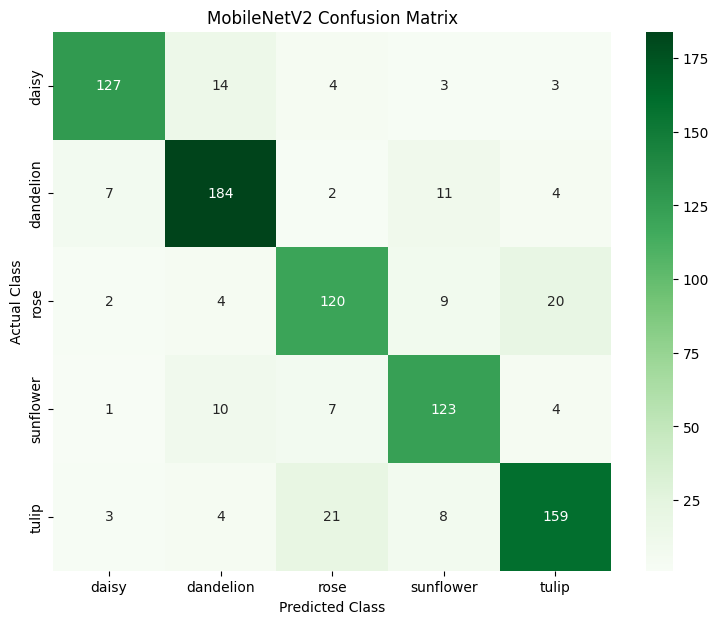

In [62]:
mobilenet_true_labels = []
mobilenet_predicted_labels = []

# Generate predictions using validation dataset
for batch_index in range(len(validation_data)):
    batch_images, batch_targets = validation_data[batch_index]

    prediction_scores = mobilenet_model.predict(
        batch_images,
        verbose=0
    )

    mobilenet_true_labels.extend(
        np.argmax(batch_targets, axis=1)
    )

    mobilenet_predicted_labels.extend(
        np.argmax(prediction_scores, axis=1)
    )

# Create confusion matrix
mobilenet_conf_matrix = confusion_matrix(
    mobilenet_true_labels,
    mobilenet_predicted_labels
)

# Plot confusion matrix
plt.figure(figsize=(9, 7))
sns.heatmap(
    mobilenet_conf_matrix,
    annot=True,
    fmt="d",
    cmap="Greens",
    xticklabels=flower_labels,
    yticklabels=flower_labels
)

plt.xlabel("Predicted Class")
plt.ylabel("Actual Class")
plt.title("MobileNetV2 Confusion Matrix")
plt.show()

In [63]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

# Calculate MobileNetV2 evaluation metrics
mobilenet_accuracy = accuracy_score(
    mobilenet_true_labels,
    mobilenet_predicted_labels
)

mobilenet_precision = precision_score(
    mobilenet_true_labels,
    mobilenet_predicted_labels,
    average="weighted"
)

mobilenet_recall = recall_score(
    mobilenet_true_labels,
    mobilenet_predicted_labels,
    average="weighted"
)

mobilenet_f1_score = f1_score(
    mobilenet_true_labels,
    mobilenet_predicted_labels,
    average="weighted"
)
print("MobileNetV2 Accuracy :", mobilenet_accuracy)
print("MobileNetV2 Precision:", mobilenet_precision)
print("MobileNetV2 Recall   :", mobilenet_recall)
print("MobileNetV2 F1 Score :", mobilenet_f1_score)

#saving metrics for final comparison
model_results["MobileNetV2"] = {
    "Accuracy": mobilenet_accuracy,
    "Precision": mobilenet_precision,
    "Recall": mobilenet_recall,
    "F1 Score": mobilenet_f1_score,
    "Training Time (sec)": training_times.get(
        "MobileNetV2"
    )
}

MobileNetV2 Accuracy : 0.8348946135831382
MobileNetV2 Precision: 0.8359940002704702
MobileNetV2 Recall   : 0.8348946135831382
MobileNetV2 F1 Score : 0.8349882114922602


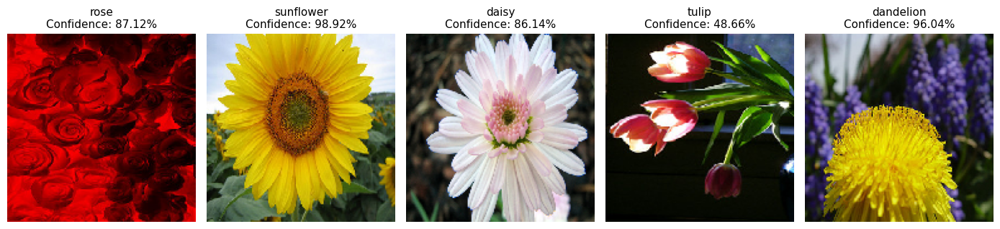

In [64]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import (
    load_img,
    img_to_array
)

image_size = (150, 150)
mobilenet_classes = [
    "daisy",
    "dandelion",
    "rose",
    "sunflower",
    "tulip"
]

# Prepare image for MobileNetV2 prediction
def prepare_mobilenet_image(image_path):
    image = load_img(
        image_path,
        target_size=image_size
    )
    image_array = img_to_array(image)
    image_array = image_array / 255.0
    image_array = np.expand_dims(
        image_array,
        axis=0
    )
    return image_array

# Collect sample test images
mobilenet_test_images = []

for root, folders, files in os.walk(test_dir):
    for file_name in files:
        if file_name.lower().endswith(
            (".jpg", ".jpeg", ".png")
        ):
            relative_path = os.path.relpath(
                os.path.join(root, file_name),
                test_dir
            )
            mobilenet_test_images.append(relative_path)

# Use first few images
mobilenet_test_images = mobilenet_test_images[:5]

# Create figure
fig, axes = plt.subplots(
    1,
    len(mobilenet_test_images),
    figsize=(14, 7)
)

# Prevent subplot error for single image
if len(mobilenet_test_images) == 1:
    axes = [axes]

# Predict and display images
for image_index, image_file in enumerate(mobilenet_test_images):

    image_path = os.path.join(
        test_dir,
        image_file
    )

    original_image = load_img(
        image_path,
        target_size=image_size
    )

    model_input = prepare_mobilenet_image(
        image_path
    )

    prediction = mobilenet_model.predict(
        model_input,
        verbose=0
    )

    predicted_index = np.argmax(
        prediction,
        axis=1
    )[0]

    predicted_label = mobilenet_classes[
        predicted_index
    ]

    confidence_score = prediction[0][
        predicted_index
    ]

    axes[image_index].imshow(
        original_image
    )

    axes[image_index].set_title(
        f"{predicted_label}\nConfidence: {confidence_score:.2%}",
        fontsize=11
    )

    axes[image_index].set_xlabel(
        image_file,
        fontsize=8
    )

    axes[image_index].axis("off")
plt.tight_layout()
plt.savefig(
    "mobilenet_prediction_visualization.png"
)
plt.show()

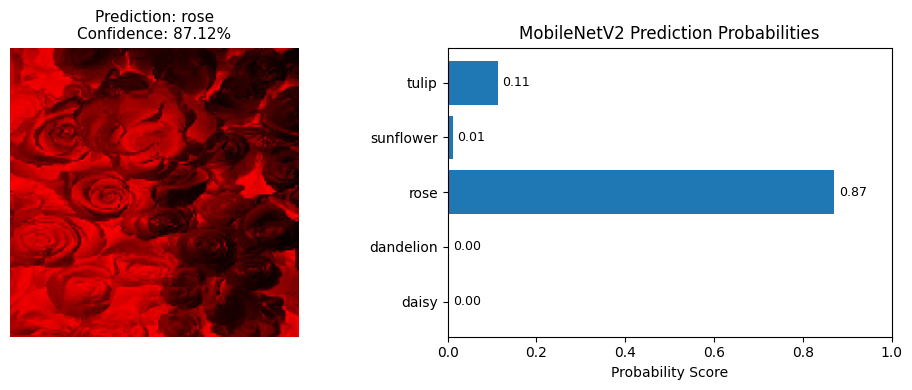

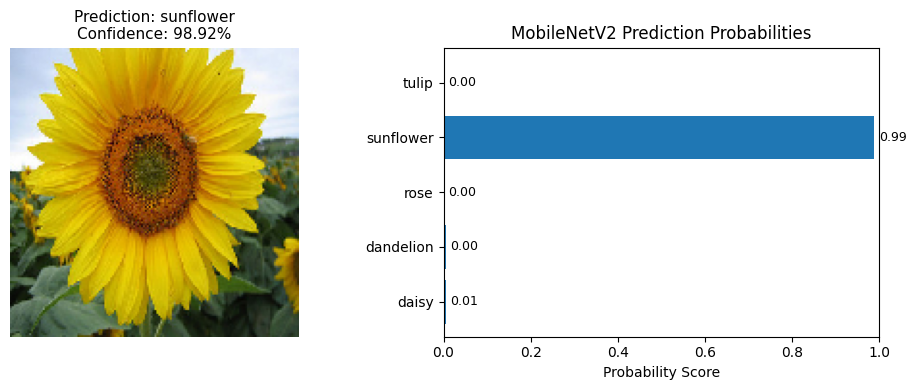

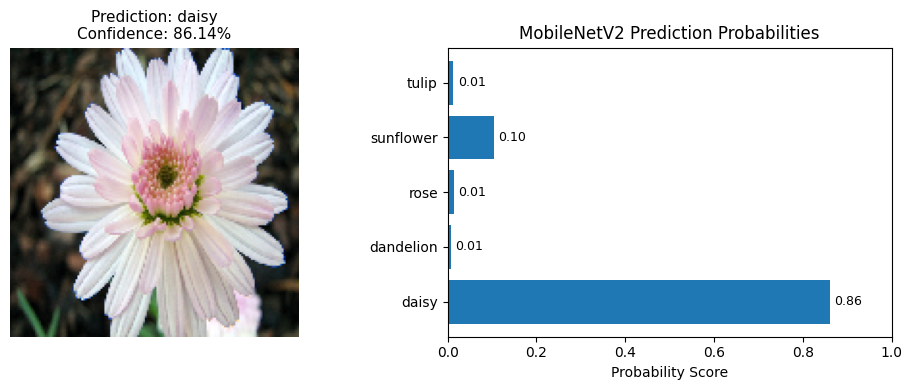

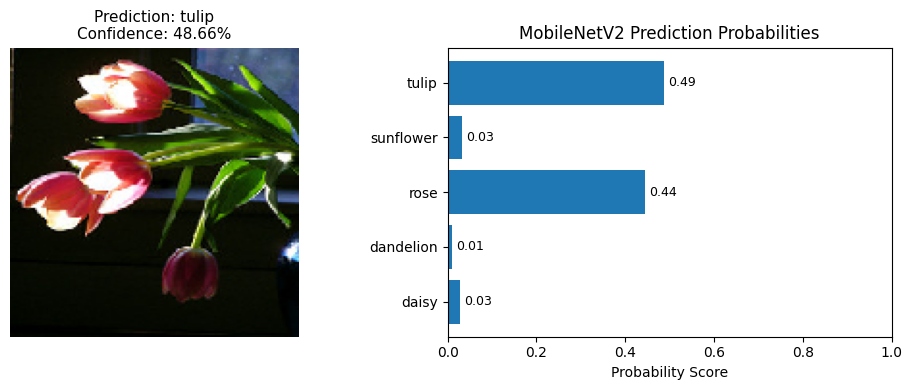

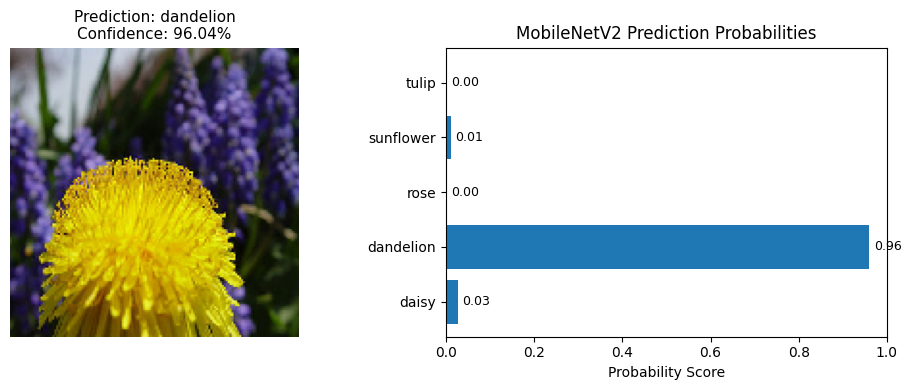

In [65]:
import matplotlib.pyplot as plt
import numpy as np

# Display MobileNetV2 prediction probabilities
for image_index, image_file in enumerate(mobilenet_test_images):
    image_path = os.path.join(
        test_dir,
        image_file
    )
    # Prepare image for prediction
    prepared_image = prepare_mobilenet_image(
        image_path
    )

    # Generate prediction
    prediction_scores = mobilenet_model.predict(
        prepared_image,
        verbose=0
    )

    predicted_index = np.argmax(
        prediction_scores[0]
    )

    predicted_flower = mobilenet_classes[
        predicted_index
    ]

    confidence_score = prediction_scores[0][
        predicted_index
    ]

    # Create subplot
    fig, (image_plot, probability_plot) = plt.subplots(
        1,
        2,
        figsize=(10, 4)
    )

    # Display image
    original_image = load_img(
        image_path,
        target_size=image_size
    )
    image_plot.imshow(original_image)
    image_plot.axis("off")
    image_plot.set_title(
        f"Prediction: {predicted_flower}\nConfidence: {confidence_score:.2%}",
        fontsize=11
    )

    # Horizontal probability chart
    y_positions = np.arange(
        len(mobilenet_classes)
    )
    probability_plot.barh(
        y_positions,
        prediction_scores[0]
    )

    probability_plot.set_yticks(
        y_positions
    )

    probability_plot.set_yticklabels(
        mobilenet_classes
    )

    probability_plot.set_xlim(0, 1)

    probability_plot.set_xlabel(
        "Probability Score"
    )

    probability_plot.set_title(
        "MobileNetV2 Prediction Probabilities"
    )

    # Add probability values
    for i, score in enumerate(
        prediction_scores[0]
    ):
        probability_plot.text(
            score + 0.01,
            i,
            f"{score:.2f}",
            va="center",
            fontsize=9
        )
    plt.tight_layout()
    plt.show()

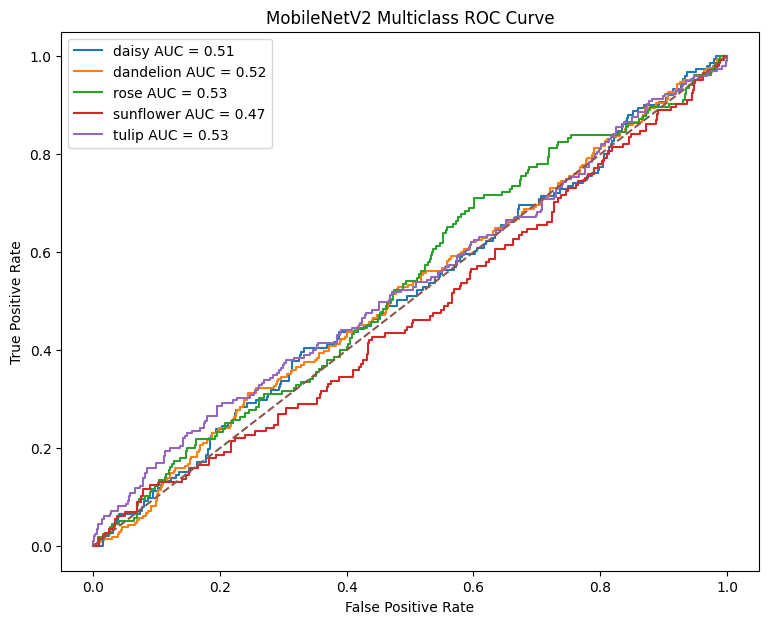

In [66]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np

validation_data.reset()
# True labels from validation data
true_class_indices = validation_data.classes

# Predicted probabilities from MobileNetV2 model
predicted_probabilities = mobilenet_model.predict(
    validation_data,
    verbose=0
)

# Number of classes
number_of_classes = len(mobilenet_classes)

# Convert labels into binary format for multiclass ROC
true_labels_binary = label_binarize(
    true_class_indices,
    classes=range(number_of_classes)
)

# Plot ROC curve
plt.figure(figsize=(9, 7))
for class_index, class_name in enumerate(mobilenet_classes):
    false_positive_rate, true_positive_rate, _ = roc_curve(
        true_labels_binary[:, class_index],
        predicted_probabilities[:, class_index]
    )

    roc_auc = auc(
        false_positive_rate,
        true_positive_rate
    )

    plt.plot(
        false_positive_rate,
        true_positive_rate,
        label=f"{class_name} AUC = {roc_auc:.2f}"
    )

plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--"
)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("MobileNetV2 Multiclass ROC Curve")
plt.legend()
plt.show()

# VGG16

In [67]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Dense,
    Dropout,
    Flatten
)
from tensorflow.keras.optimizers import Adam

vgg_input_shape = (150, 150, 3)
vgg_classes = [
    "daisy",
    "dandelion",
    "rose",
    "sunflower",
    "tulip"
]
vgg_class_count = len(vgg_classes)

# Load pretrained VGG16 model without original classifier
vgg_base = VGG16(
    input_shape=vgg_input_shape,
    include_top=False,
    weights="imagenet",
    pooling=None
)

# Freeze all pretrained layers first
for layer in vgg_base.layers:
    layer.trainable = False

# Fine-tune only the last four layers
for layer in vgg_base.layers[-4:]:
    layer.trainable = True

# Add custom classification layers
vgg_features = vgg_base.output

vgg_features = Flatten()(vgg_features)

vgg_features = Dense(
    512,
    activation="relu"
)(vgg_features)

vgg_features = Dropout(0.5)(vgg_features)

vgg_features = Dense(
    256,
    activation="relu"
)(vgg_features)

vgg_features = Dropout(0.4)(vgg_features)
vgg_output = Dense(
    vgg_class_count,
    activation="softmax"
)(vgg_features)

# Build final VGG16 transfer learning model
vgg_model = Model(
    inputs=vgg_base.input,
    outputs=vgg_output
)
vgg_model.compile(
    optimizer=Adam(
        learning_rate=2e-4
    ),
    loss="categorical_crossentropy",
    metrics=[
        "accuracy",
        "Precision",
        "Recall",
        "AUC"
    ]
)

vgg_model.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 512)            │     4,194,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_24 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_25 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 5)              │         1,28

 Total params: 19,042,117 (72.64 MB)

 Trainable params: 11,406,853 (43.51 MB)

 Non-trainable params: 7,635,264 (29.13 MB)

In [68]:
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau
)

import time

# Early stopping callback for VGG16
vgg_early_stop = EarlyStopping(
    monitor="val_loss",
    patience=3,
    restore_best_weights=True
)

# Reduce learning rate when validation loss plateaus
vgg_lr_scheduler = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=2,
    verbose=1
)

# Start training timer
vgg_training_start = time.time()

# Train VGG16 transfer learning model
history_vgg16 = vgg_model.fit(
    train_data,
    epochs=100,
    validation_data=validation_data,
    callbacks=[
        vgg_early_stop,
        vgg_lr_scheduler
    ]
)

# Store total training duration
training_times["VGG16"] = (
    time.time() - vgg_training_start
)

print(
    "VGG16 Training Time:",
    round(
        training_times["VGG16"],
        2
    ),
    "seconds"
)

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - AUC: 0.8458 - Precision: 0.7319 - Recall: 0.4075 - accuracy: 0.5682 - loss: 1.0868 - val_AUC: 0.9268 - val_Precision: 0.8042 - val_Recall: 0.6347 - val_accuracy: 0.7225 - val_loss: 0.7689 - learning_rate: 2.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 54s 956ms/step - AUC: 0.9560 - Precision: 0.8641 - Recall: 0.7155 - accuracy: 0.7897 - loss: 0.5892 - val_AUC: 0.9688 - val_Precision: 0.8708 - val_Recall: 0.7810 - val_accuracy: 0.8244 - val_loss: 0.4916 - learning_rate: 2.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 37s 685ms/step - AUC: 0.9714 - Precision: 0.8906 - Recall: 0.7730 - accuracy: 0.8306 - loss: 0.4733 - val_AUC: 0.9726 - val_Precision: 0.8840 - val_Recall: 0.7939 - val_accuracy: 0.8384 - val_loss: 0.4638 - learning_rate: 2.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 46s 852ms/step - AUC: 0.9778 - Precision: 0.8998 - Recall: 0.8057 - accuracy: 0.8554 - loss: 0.4115 - val_AUC: 0.9671 - val_Precision: 0.8818 - val_

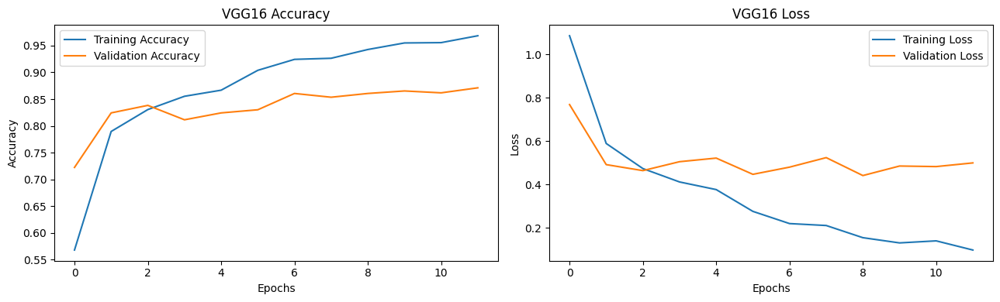

In [69]:
import matplotlib.pyplot as plt

# Create VGG16 training performance plots
fig, axes = plt.subplots(
    1,
    2,
    figsize=(13, 4)
)

# Accuracy plot
axes[0].plot(
    history_vgg16.history["accuracy"],
    label="Training Accuracy"
)
axes[0].plot(
    history_vgg16.history["val_accuracy"],
    label="Validation Accuracy"
)
axes[0].set_title(
    "VGG16 Accuracy"
)
axes[0].set_xlabel("Epochs")
axes[0].set_ylabel("Accuracy")
axes[0].legend()

# Loss plot
axes[1].plot(
    history_vgg16.history["loss"],
    label="Training Loss"
)
axes[1].plot(
    history_vgg16.history["val_loss"],
    label="Validation Loss"
)
axes[1].set_title(
    "VGG16 Loss"
)
axes[1].set_xlabel("Epochs")
axes[1].set_ylabel("Loss")
axes[1].legend()
plt.tight_layout()
plt.show()

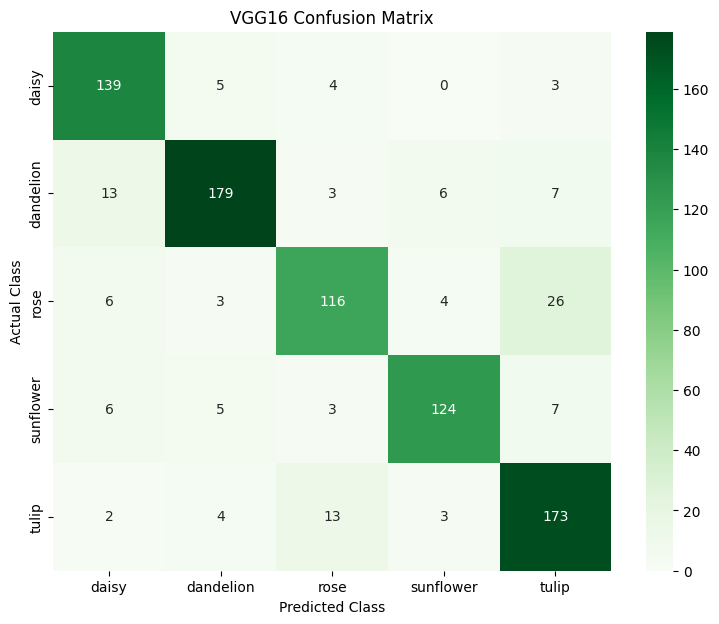

In [71]:
vgg_true_labels = []
vgg_predicted_labels = []

# Generate predictions using validation dataset
for batch_index in range(len(validation_data)):
    batch_images, batch_targets = validation_data[batch_index]
    prediction_scores = vgg_model.predict(
        batch_images,
        verbose=0
    )
    vgg_true_labels.extend(
        np.argmax(batch_targets, axis=1)
    )

    vgg_predicted_labels.extend(
        np.argmax(prediction_scores, axis=1)
    )

# Create confusion matrix
vgg_conf_matrix = confusion_matrix(
    vgg_true_labels,
    vgg_predicted_labels
)

# Plot confusion matrix
plt.figure(figsize=(9, 7))
sns.heatmap(
    vgg_conf_matrix,
    annot=True,
    fmt="d",
    cmap="Greens",
    xticklabels=vgg_classes,
    yticklabels=vgg_classes
)
plt.xlabel("Predicted Class")
plt.ylabel("Actual Class")
plt.title("VGG16 Confusion Matrix")
plt.show()

In [72]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

# Calculate VGG16 evaluation metrics
vgg_accuracy = accuracy_score(
    vgg_true_labels,
    vgg_predicted_labels
)

vgg_precision = precision_score(
    vgg_true_labels,
    vgg_predicted_labels,
    average="weighted"
)

vgg_recall = recall_score(
    vgg_true_labels,
    vgg_predicted_labels,
    average="weighted"
)

vgg_f1_score = f1_score(
    vgg_true_labels,
    vgg_predicted_labels,
    average="weighted"
)

# Print performance metrics
print("VGG16 Accuracy :", vgg_accuracy)
print("VGG16 Precision:", vgg_precision)
print("VGG16 Recall   :", vgg_recall)
print("VGG16 F1 Score :", vgg_f1_score)

#saving metrics for final comparison
model_results["VGG16"] = {
    "Accuracy": vgg_accuracy,
    "Precision": vgg_precision,
    "Recall": vgg_recall,
    "F1 Score": vgg_f1_score,
    "Training Time (sec)": training_times.get(
        "VGG16"
    )
}

VGG16 Accuracy : 0.8559718969555035
VGG16 Precision: 0.8585162671700114
VGG16 Recall   : 0.8559718969555035
VGG16 F1 Score : 0.8556566560012295


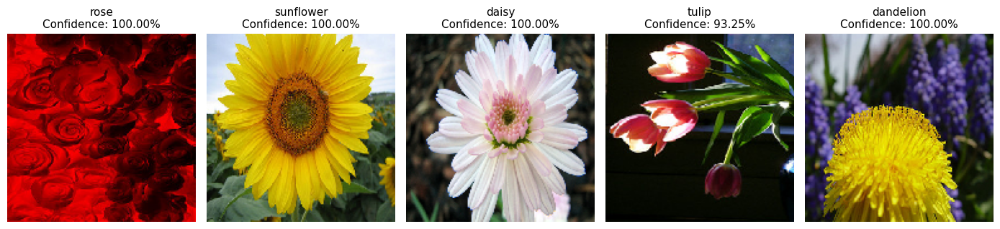

In [73]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import (
    load_img,
    img_to_array
)
image_size = (150, 150)
vgg_classes = [
    "daisy",
    "dandelion",
    "rose",
    "sunflower",
    "tulip"
]

# Prepare image for VGG16 prediction
def prepare_vgg_image(image_path):
    image = load_img(
        image_path,
        target_size=image_size
    )
    image_array = img_to_array(image)
    image_array = image_array / 255.0
    image_array = np.expand_dims(
        image_array,
        axis=0
    )
    return image_array

# Collect sample test images
vgg_test_images = []
for root, folders, files in os.walk(test_dir):
    for file_name in files:
        if file_name.lower().endswith(
            (".jpg", ".jpeg", ".png")
        ):
            relative_path = os.path.relpath(
                os.path.join(root, file_name),
                test_dir
            )
            vgg_test_images.append(relative_path)

# Use first few images
vgg_test_images = vgg_test_images[:5]

# Create figure
fig, axes = plt.subplots(
    1,
    len(vgg_test_images),
    figsize=(14, 7)
)

# Prevent subplot error for single image
if len(vgg_test_images) == 1:
    axes = [axes]

# Predict and display images
for image_index, image_file in enumerate(vgg_test_images):
    image_path = os.path.join(
        test_dir,
        image_file
    )
    original_image = load_img(
        image_path,
        target_size=image_size
    )

    model_input = prepare_vgg_image(
        image_path
    )

    prediction = vgg_model.predict(
        model_input,
        verbose=0
    )

    predicted_index = np.argmax(
        prediction,
        axis=1
    )[0]

    predicted_label = vgg_classes[
        predicted_index
    ]

    confidence_score = prediction[0][
        predicted_index
    ]
    axes[image_index].imshow(
        original_image
    )
    axes[image_index].set_title(
        f"{predicted_label}\nConfidence: {confidence_score:.2%}",
        fontsize=11
    )
    axes[image_index].set_xlabel(
        image_file,
        fontsize=8
    )
    axes[image_index].axis("off")
plt.tight_layout()
plt.savefig(
    "vgg16_prediction_visualization.png"
)
plt.show()

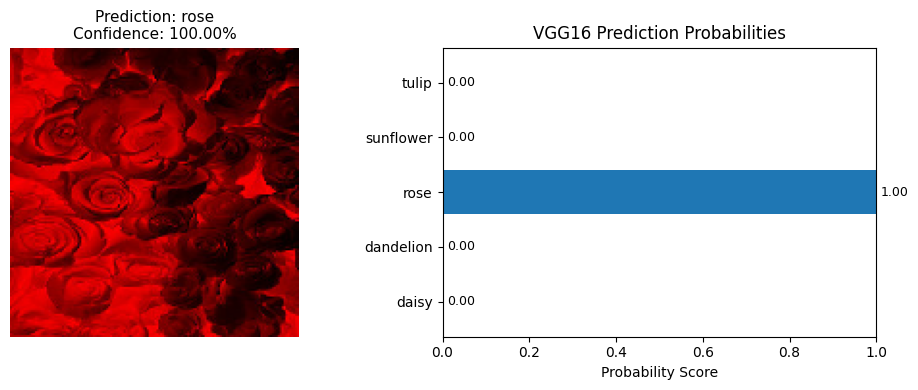

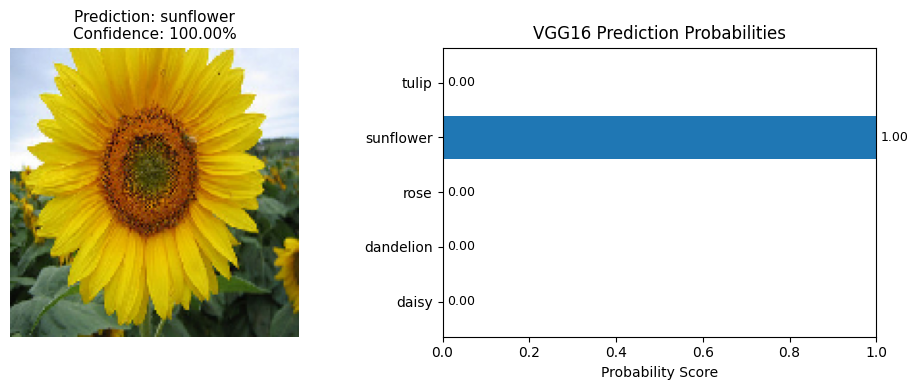

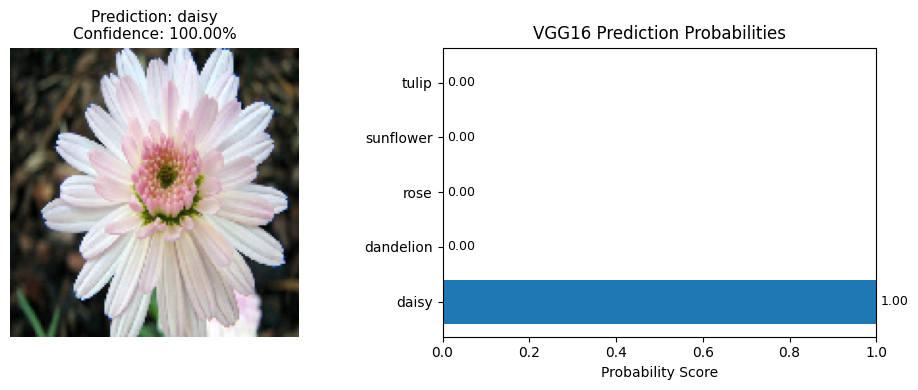

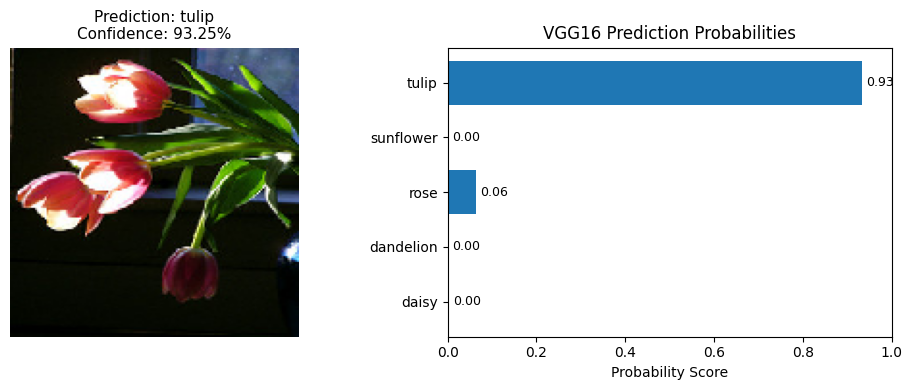

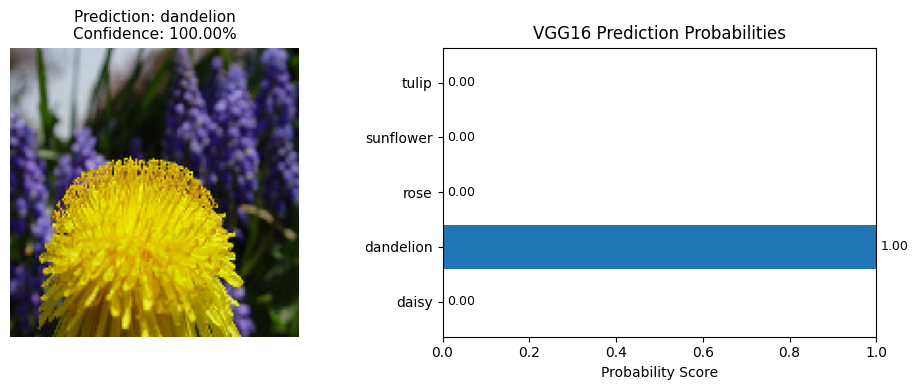

In [74]:
import matplotlib.pyplot as plt
import numpy as np

# Display VGG16 prediction probabilities
for image_index, image_file in enumerate(vgg_test_images):
    image_path = os.path.join(
        test_dir,
        image_file
    )
    # Prepare image for prediction
    prepared_image = prepare_vgg_image(
        image_path
    )

    # Generate prediction probabilities
    prediction_scores = vgg_model.predict(
        prepared_image,
        verbose=0
    )

    predicted_index = np.argmax(
        prediction_scores[0]
    )

    predicted_flower = vgg_classes[
        predicted_index
    ]

    confidence_score = prediction_scores[0][
        predicted_index
    ]

    # Create subplot
    fig, (image_plot, probability_plot) = plt.subplots(
        1,
        2,
        figsize=(10, 4)
    )

    # Display image
    original_image = load_img(
        image_path,
        target_size=image_size
    )
    image_plot.imshow(original_image)
    image_plot.axis("off")
    image_plot.set_title(
        f"Prediction: {predicted_flower}\nConfidence: {confidence_score:.2%}",
        fontsize=11
    )

    # Horizontal probability chart
    y_positions = np.arange(
        len(vgg_classes)
    )

    probability_plot.barh(
        y_positions,
        prediction_scores[0]
    )

    probability_plot.set_yticks(
        y_positions
    )

    probability_plot.set_yticklabels(
        vgg_classes
    )

    probability_plot.set_xlim(0, 1)

    probability_plot.set_xlabel(
        "Probability Score"
    )

    probability_plot.set_title(
        "VGG16 Prediction Probabilities"
    )

    # Display probability values
    for i, score in enumerate(
        prediction_scores[0]
    ):
        probability_plot.text(
            score + 0.01,
            i,
            f"{score:.2f}",
            va="center",
            fontsize=9
        )
    plt.tight_layout()
    plt.show()

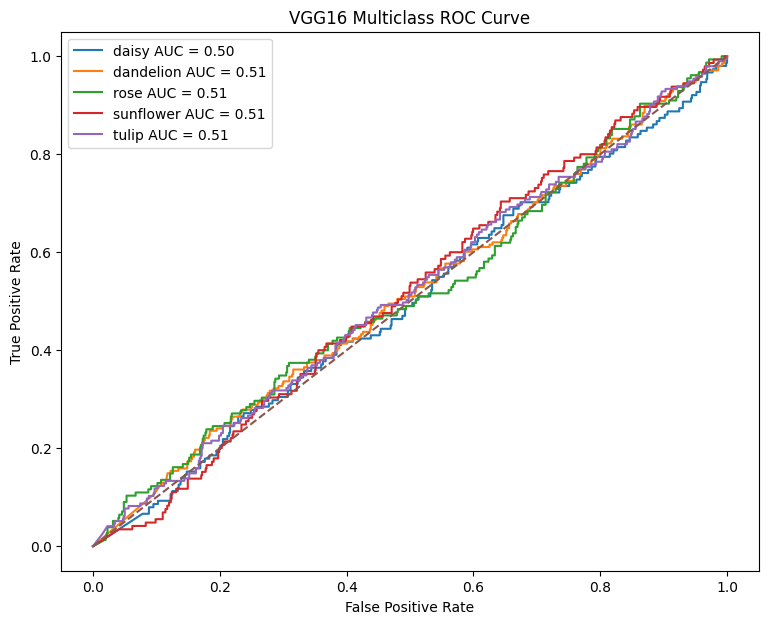

In [75]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np

# Reset validation data
validation_data.reset()

# Actual labels from validation dataset
vgg_actual_labels = validation_data.classes

# Predicted probabilities from VGG16 model
vgg_prediction_probs = vgg_model.predict(
    validation_data,
    verbose=0
)

# Number of classes
vgg_num_classes = len(vgg_classes)

# Binarize labels for multiclass ROC
vgg_labels_binary = label_binarize(
    vgg_actual_labels,
    classes=range(vgg_num_classes)
)

# Plot ROC curve
plt.figure(figsize=(9, 7))

for class_index, class_name in enumerate(vgg_classes):
    false_positive_rate, true_positive_rate, _ = roc_curve(
        vgg_labels_binary[:, class_index],
        vgg_prediction_probs[:, class_index]
    )
    roc_auc_value = auc(
        false_positive_rate,
        true_positive_rate
    )
    plt.plot(
        false_positive_rate,
        true_positive_rate,
        label=f"{class_name} AUC = {roc_auc_value:.2f}"
    )
plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--"
)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("VGG16 Multiclass ROC Curve")
plt.legend()
plt.show()

In [79]:
import pandas as pd

comparison_df = pd.DataFrame(model_results).T
comparison_df = comparison_df.sort_values(by='F1 Score', ascending=False)
comparison_df

,Accuracy,Precision,Recall,F1 Score,Training Time (sec)
VGG16,0.855972,0.858516,0.855972,0.855657,566.194441
MobileNetV2,0.834895,0.835994,0.834895,0.834988,455.863962
Baseline CNN,0.693208,0.698616,0.693208,0.690920,499.347670
Deeper CNN - SGD,0.222482,0.106944,0.222482,0.115789,301.007827
Ablation - No Dropout,0.243560,0.059321,0.243560,0.095406,112.719483
Deeper CNN - Adam,0.243560,0.059321,0.243560,0.095406,186.820397
